In [1]:
%pip install pandas
%pip install scipy
%pip install numpy
%pip install seaborn
%pip install matplotlib
%pip install statsmodels
%pip install scikit-learn
%pip install shap

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


# Welcome to Exploratory Data Analysis!

## Functions Needed for the Notebook

In [2]:
import seaborn as sns
import math 
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import pandas as pd
import statsmodels.api as sm

plt.style.use('ggplot')

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [3]:
def print_df(df):
    # Print the DataFrame
    with pd.option_context('display.max_rows', 20, 'display.max_columns', None): 
        display(df)

### Univariate Analysis

#### Histogram

In [4]:
def display_histogram(df):
    df.hist(figsize=(25, 20))
    plt.tight_layout()  # Adjust layout to prevent overlapping
    plt.show()

#### Boxplot

In [5]:
def display_boxplot(data):
    numeric_features = data.columns

    num_features = len(numeric_features)
    num_cols = 2  # You can adjust the number of columns as needed
    num_rows = math.ceil(num_features / num_cols)

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(10, 2 * num_rows))
    fig.suptitle('Boxplots of Numeric Features', y=1.02)

    for idx, feature in enumerate(numeric_features):
        ax = axes[idx // 2, idx % 2]
        sns.boxplot(x=data[feature], ax=ax)
        ax.set_title(f'Boxplot of {feature}')

    # Adjust layout
    plt.tight_layout()
    plt.show()

#### Scatter Plot

In [6]:
def display_scatter_plot(df, column_x, column_y):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df[column_x], y=df[column_y])
    plt.title(f'Scatter Plot of {column_x} vs {column_y}')
    plt.xlabel(column_x)
    plt.ylabel(column_y)
    plt.grid(True)
    plt.show()

### Bivariate Analysis

In [7]:
def correlation_heatmap(data):
    # Correlation table for features
    correlation_table = data.corr(method='spearman')

    # Correlation heatmap for features
    plt.figure(figsize=(20, 8))
    sns.heatmap(correlation_table, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
    plt.title('Correlation Heatmap')
    plt.show()

In [8]:
def p_value_matrix_spearmanr(X, Y):
    # Initialize p-value matrix
    num_features = len(X.columns)
    num_targets = len(Y.columns)
    correlation_matrix = np.zeros((num_features, num_targets))
    p_value_matrix = np.zeros((num_features, num_targets))

    # Calculate p-values for each feature-target pair
    for i, feature in enumerate(X.columns):
        for j, target in enumerate(Y.columns):
            corr, p_value = spearmanr(X[feature], Y[target])
            p_value_matrix[i, j] = p_value
            correlation_matrix[i, j] = corr

    # Convert p-value matrix to DataFrame
    corr_df = pd.DataFrame(correlation_matrix, index=X.columns, columns=Y.columns)
    p_value_df = pd.DataFrame(p_value_matrix, index=X.columns, columns=Y.columns)
    return corr_df, p_value_df

In [9]:
def visualize_p_value_matrix(p_value_matrix):
    plt.figure(figsize=(10, 8))
    sns.heatmap(p_value_matrix, annot=True, cmap='coolwarm', fmt=".10f")
    plt.title('P-Value Matrix Heatmap')
    plt.xlabel('Y Labels')
    plt.ylabel('X Features')
    plt.show()

### Linearity Assumptions

In [10]:
linearities = {
    'feature': [],
    'Rainbow p_value': [],
    'isLinear on Rainbow': [],
    'Harvey Collier p_value': [],
    'isLinear on Harvey Collier': []
}

In [11]:
import statsmodels.stats.api as sms
import statsmodels.regression.linear_model as smf

def linearity_tests(df, feature_col, target_col):
    # Extract the feature and target
    X = df[feature_col]
    y = df[target_col]

    # Add a constant term for the intercept
    X = sm.add_constant(X)

    # Fit the OLS model
    model = sm.OLS(y, X).fit()

    lin_p = sms.linear_rainbow(model)[1]
    harv_p = sms.linear_harvey_collier(model)[1]
    result = "Not Linear" if lin_p <= 0.05 else "Linear"
    harv_p_res = "Not Linear" if harv_p <= 0.05 else "Linear"

    return (lin_p, result, harv_p, harv_p_res)


def check_linearity(df, features, target):

    for value in linearities.values():
        value.clear()

    for feature in features:
        p, res, har_p, har_res = linearity_tests(df, feature, target)
        linearities['feature'].append(feature)
        linearities['Rainbow p_value'].append(p)
        linearities['isLinear on Rainbow'].append(res)
        linearities['Harvey Collier p_value'].append(har_p)
        linearities['isLinear on Harvey Collier'].append(har_res)


    return pd.DataFrame(linearities)

In [12]:
def OLS_whole(X, y):

    # Add a constant term for the intercept
    X = sm.add_constant(X)

    # Fit the OLS model
    model = sm.OLS(y, X).fit()

    # Print the summary
    print(model.summary())

    # Predict the values
    predictions = model.predict(X)

    # Create the scatterplot
    plt.figure(figsize=(10, 6))
    plt.scatter(predictions, y, alpha=0.5, color='b', label='Actual vs. Predicted')
    plt.plot(predictions, predictions, color='r', label='Regression Line')

    # Add labels and title
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title('Actual vs. Predicted Values with Regression Line')
    plt.legend()
    plt.show()


## Whole Dataset

### Getting the Datasets

In [13]:
df = pd.read_csv("whole.csv")
print_df(df)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,134.0,9,0.019608,41.457420,2.194367e-04,0.008291,0.027406,0.000395,0.009640,0.031045,6.145828e-04,0.005179,0.015663,0.047779,0.306350,0.925868,0.049043,0.385449,1.123576,0.001724,0.225927,0.636547,1204.954477,747.392087,1170.061419,725.004766,22.387321,34.893058,2.429869,1.716384
1,189.0,18,0.050980,7.468287,4.235585e-05,0.003297,0.032863,0.000049,0.001586,0.006262,1.209784e-04,0.001611,0.007896,0.012379,0.060740,0.106315,0.033891,0.082642,0.130349,0.004839,0.050932,0.080163,1363.466980,813.569934,1357.453179,809.141672,4.428261,6.013802,3.374759,3.479655
2,10929.0,888,0.105882,212.076642,1.932184e-06,0.014012,0.291054,0.000025,0.003680,0.134571,7.461655e-07,0.011947,0.558334,0.001806,0.126974,1.201133,0.005476,0.175037,2.477405,0.000021,0.096131,2.239881,1294.848180,612.084105,1087.498949,567.555479,44.528627,207.349231,3.569503,1.356594
3,7747.0,176,0.047059,204.035739,1.421211e-02,0.015536,0.321783,0.019224,0.005418,0.071771,1.294472e-02,0.003132,0.024216,0.213182,0.170653,2.282534,0.288355,0.206120,2.397167,0.194171,0.087846,0.732437,1133.634870,555.154525,1240.933644,381.610421,173.544104,107.298774,1.927521,4.028455
4,89.0,10,0.039216,4.217842,1.045669e-03,0.006620,0.016570,0.000104,0.003140,0.011058,3.246177e-03,0.019673,0.033147,0.000402,0.030244,0.106113,0.038700,0.093684,0.153388,0.020021,0.084661,0.139720,1399.002410,774.945655,1399.549223,779.127902,4.182247,0.546813,3.374759,3.479655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1062,885.0,19,0.035294,3.487322,7.787389e-03,0.000957,0.007787,0.013087,0.002022,0.013087,1.051768e-02,0.003242,0.013522,0.070087,0.007430,0.070087,0.117781,0.028788,0.165024,0.094659,0.026254,0.165024,1460.779387,667.683271,1461.326086,671.127474,3.444203,0.546699,3.124387,1.328262
1063,531.0,64,0.054902,528.650896,1.331808e-04,0.009395,0.023683,0.000294,0.013812,0.039614,1.278317e-03,0.187840,0.510399,0.050849,0.784005,1.493019,0.063152,1.118502,2.526632,0.025566,0.772193,2.044872,1486.474236,343.682216,1110.345269,715.164072,371.481856,376.128968,1.894761,3.661365
1064,108.0,7,0.043137,0.918470,9.960401e-08,0.000253,0.001213,0.000002,0.001427,0.004454,5.482570e-04,0.001878,0.004781,0.000079,0.006680,0.020482,0.031675,0.049866,0.074025,0.031675,0.048796,0.071469,1470.619968,792.412686,1470.073269,791.674642,0.738044,0.546699,1.358450,4.532387
1065,8492.0,363,0.062745,287.723178,2.081626e-05,0.005936,0.051554,0.000039,0.001275,0.011345,2.623149e-06,0.007385,0.094291,0.007575,0.081525,0.413844,0.023059,0.125150,0.823676,0.004914,0.074455,0.808373,1295.976837,564.457837,1335.595964,849.440208,284.982371,39.619127,2.342734,1.374810


In [14]:
df_ex = pd.read_csv("whole-extrapolated.csv")
print_df(df_ex)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,189.000000,18.000000,0.050980,7.468287,0.000042,0.003297,0.032863,0.000049,0.001586,0.006262,0.000121,0.001611,0.007896,0.012379,0.060740,0.106315,0.033891,0.082642,0.130349,0.004839,0.050932,0.080163,1363.466980,813.569934,1357.453179,809.141672,4.428261,6.013802,3.374759,3.479655
1,135.261682,13.700935,0.044658,5.721553,0.000582,0.005083,0.024107,0.000078,0.002421,0.008839,0.001800,0.011317,0.021466,0.005943,0.044352,0.106207,0.036475,0.088576,0.142730,0.012997,0.069057,0.112168,1382.563123,792.813896,1380.074885,793.012777,4.296057,3.075934,3.374759,3.479655
2,92.813084,10.149533,0.039216,4.570400,0.000968,0.006251,0.015856,0.000099,0.003059,0.010776,0.003030,0.018523,0.032010,0.003199,0.032669,0.110040,0.040105,0.093197,0.154039,0.019368,0.081333,0.135964,1398.879786,774.596177,1398.854345,778.870391,4.274215,1.037301,3.374759,3.479655
3,120.219626,11.224299,0.039216,7.104408,0.000407,0.003603,0.010721,0.000068,0.002476,0.008749,0.001476,0.010258,0.023838,0.023306,0.050103,0.138259,0.050208,0.089693,0.158717,0.014680,0.057415,0.108973,1397.998426,772.084300,1393.859908,777.019535,4.935235,4.562681,3.374759,3.479655
4,132.373832,10.953271,0.037456,7.854991,0.001456,0.002201,0.007558,0.000459,0.002420,0.007549,0.000315,0.004149,0.016610,0.036448,0.058364,0.150826,0.058373,0.084953,0.156447,0.019079,0.042570,0.090722,1411.423205,764.900446,1405.378861,769.245936,4.860511,6.044344,3.372930,3.477232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,3282.654206,57.485981,0.041745,57.730025,0.001160,0.001763,0.007655,0.000337,0.001581,0.005566,0.000291,0.002504,0.025616,0.019927,0.101251,0.252326,0.016320,0.108173,0.261445,0.009875,0.018728,0.082435,1255.756962,515.892391,1200.785619,518.966423,6.840123,54.971342,3.341659,1.343522
1712,5869.990654,46.364486,0.047975,28.417982,0.002261,0.001008,0.005895,0.000583,0.000926,0.004105,0.000568,0.002055,0.020637,0.038507,0.037546,0.124488,0.021392,0.046292,0.142408,0.019295,0.014997,0.081801,1239.905248,777.282799,1216.854480,786.415225,10.357901,23.050768,3.407942,1.344115
1713,5836.448598,36.476636,0.047755,12.060335,0.003819,0.000708,0.005610,0.003248,0.000900,0.005391,0.002719,0.002126,0.017266,0.052120,0.006944,0.064318,0.043154,0.018982,0.101445,0.038400,0.015882,0.098669,1279.244601,854.907258,1273.276897,865.191584,10.284326,6.192515,3.375039,1.341083
1714,3360.724299,27.738318,0.041525,7.773829,0.005803,0.000832,0.006699,0.008167,0.001461,0.009239,0.006619,0.002684,0.015394,0.061103,0.007187,0.067202,0.080468,0.023885,0.133235,0.066529,0.021068,0.131847,1370.011994,761.295264,1367.301492,768.159529,6.864265,3.369607,3.249713,1.334672


### Univariate Analysis - No Extrapolation

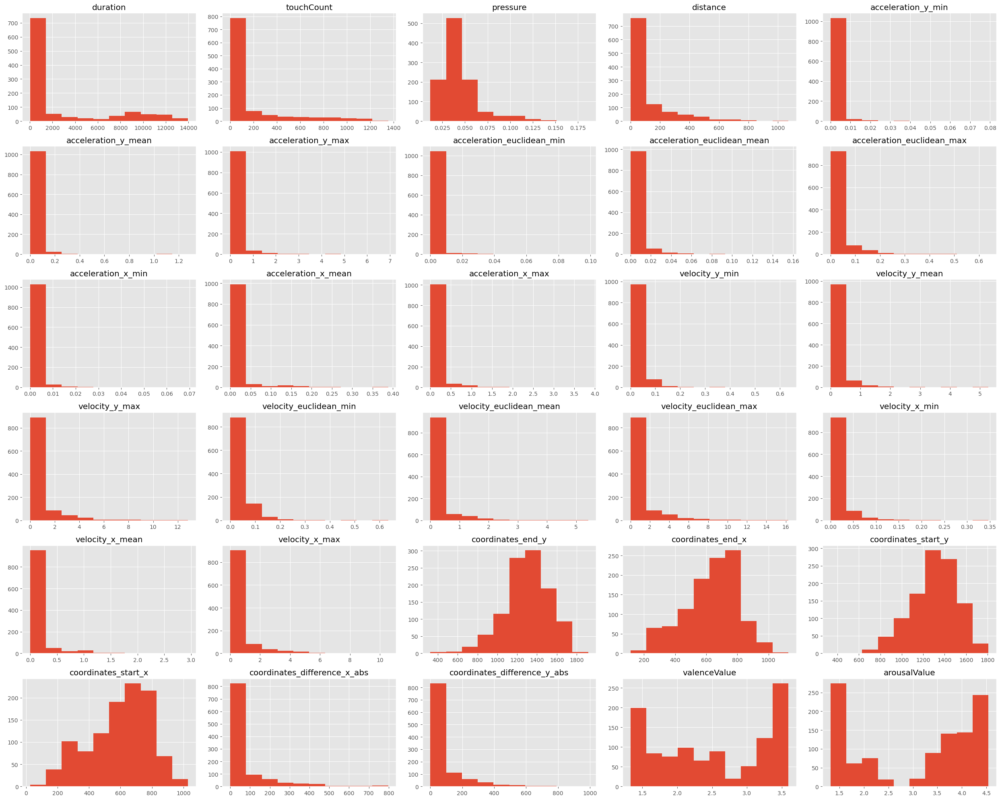

In [15]:
display_histogram(df)

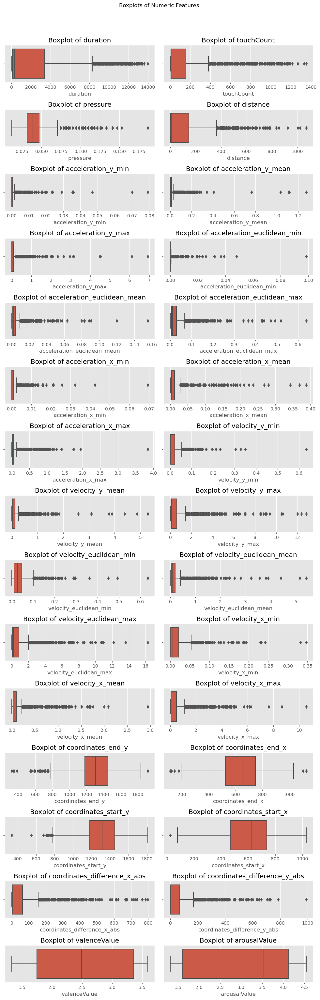

In [16]:
display_boxplot(df)

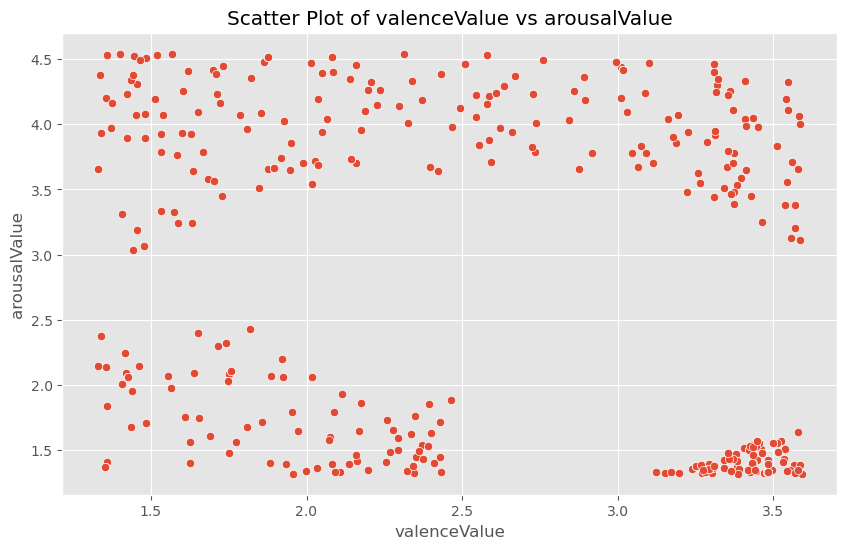

In [17]:
display_scatter_plot(df, 'valenceValue', 'arousalValue')

### Univariate Analysis - With Extrapolation

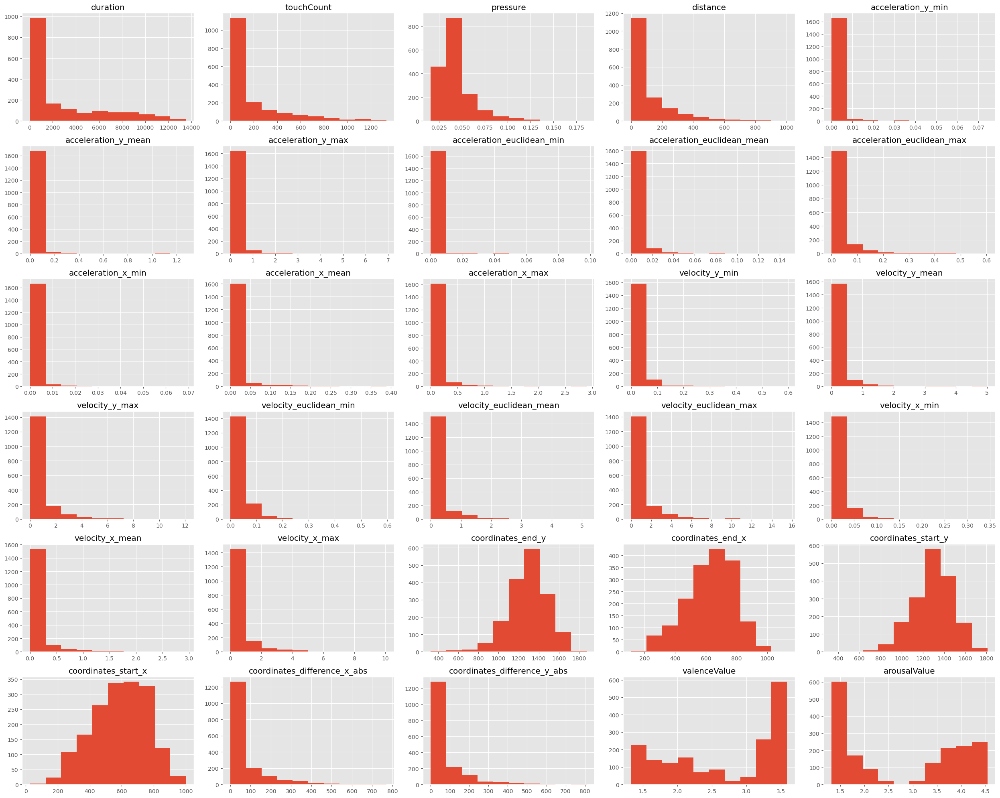

In [18]:
display_histogram(df_ex)

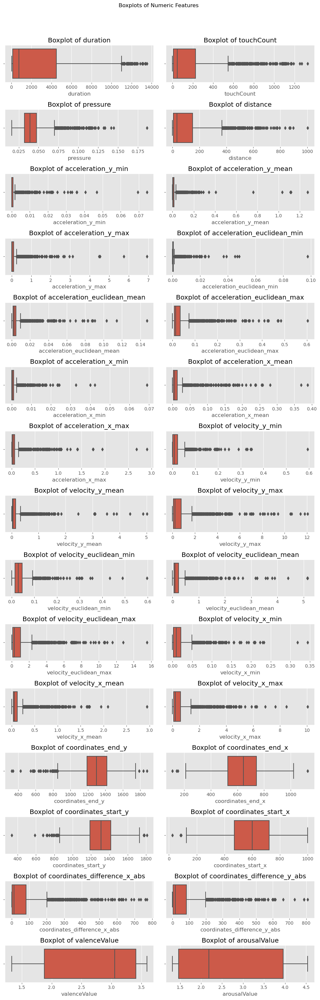

In [19]:
display_boxplot(df_ex)

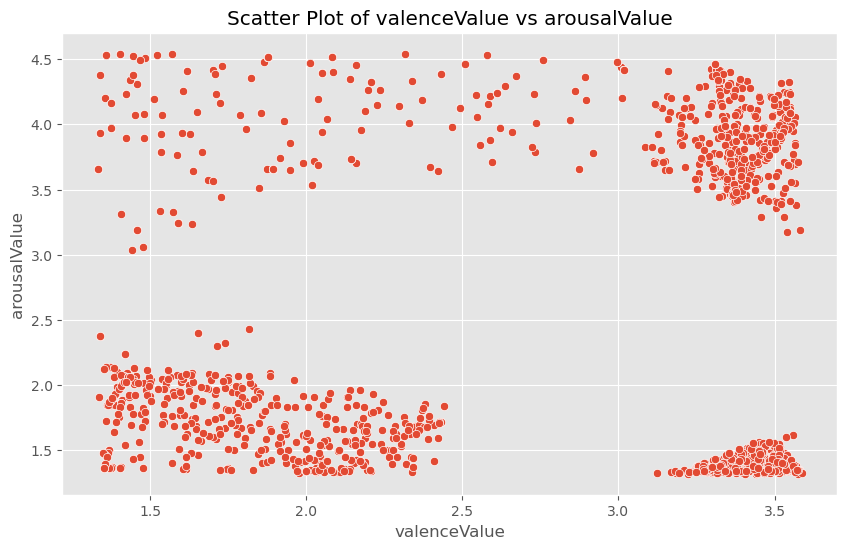

In [20]:
display_scatter_plot(df_ex, 'valenceValue', 'arousalValue')

### Bivariate Analysis - No Extrapolation

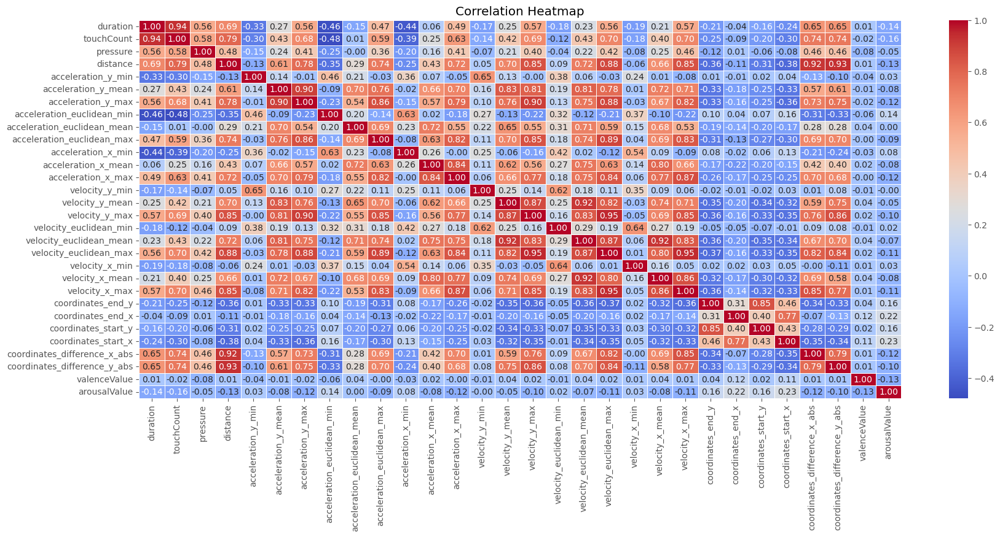

In [21]:
correlation_heatmap(df)

In [22]:
X_features = df.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df[['valenceValue', 'arousalValue']]

In [23]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,0.012154,0.691684,-0.140817,3.885310e-06
touchCount,-0.016040,0.600722,-0.161573,1.117593e-07
pressure,-0.081037,0.008089,-0.048053,1.167162e-01
distance,0.009255,0.762675,-0.126673,3.329760e-05
acceleration_y_min,-0.039618,0.195972,0.026864,3.806837e-01
acceleration_y_mean,-0.006180,0.840199,-0.075970,1.305637e-02
acceleration_y_max,-0.015213,0.619620,-0.118934,9.849676e-05
acceleration_euclidean_min,-0.057016,0.062639,0.136034,8.231040e-06
acceleration_euclidean_mean,0.035747,0.243344,0.000144,9.962564e-01
acceleration_euclidean_max,-0.002009,0.947743,-0.094109,2.088800e-03


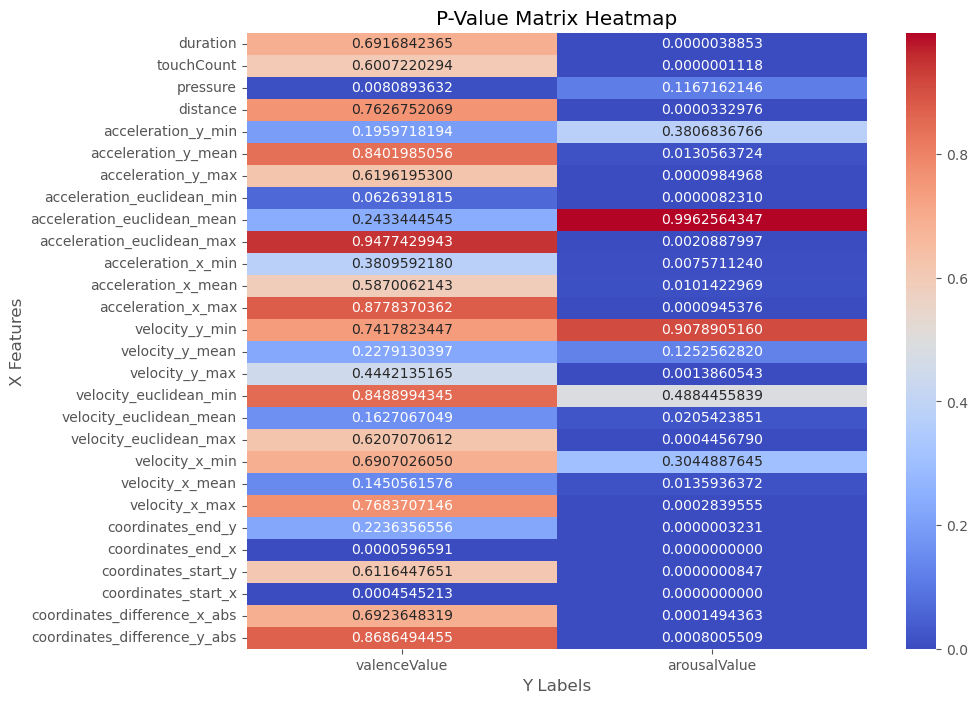

In [24]:
visualize_p_value_matrix(p_value)

In [25]:
# Getting Features with Significant Relationship (Valence)
whole_df_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
whole_df_val_sig

['pressure', 'coordinates_end_x', 'coordinates_start_x']

In [26]:
# Save to text file
np.savetxt('whole_df_val_sig.txt', whole_df_val_sig, fmt='%s')

In [27]:
# Getting Features with Significant Relationship (Valence)
whole_df_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
whole_df_ars_sig

['duration',
 'touchCount',
 'distance',
 'acceleration_y_mean',
 'acceleration_y_max',
 'acceleration_euclidean_min',
 'acceleration_euclidean_max',
 'acceleration_x_min',
 'acceleration_x_mean',
 'acceleration_x_max',
 'velocity_y_max',
 'velocity_euclidean_mean',
 'velocity_euclidean_max',
 'velocity_x_mean',
 'velocity_x_max',
 'coordinates_end_y',
 'coordinates_end_x',
 'coordinates_start_y',
 'coordinates_start_x',
 'coordinates_difference_x_abs',
 'coordinates_difference_y_abs']

In [28]:
np.savetxt('whole_df_ars_sig.txt', whole_df_ars_sig, fmt='%s')

### Bivariate Analysis - With Extrapolation

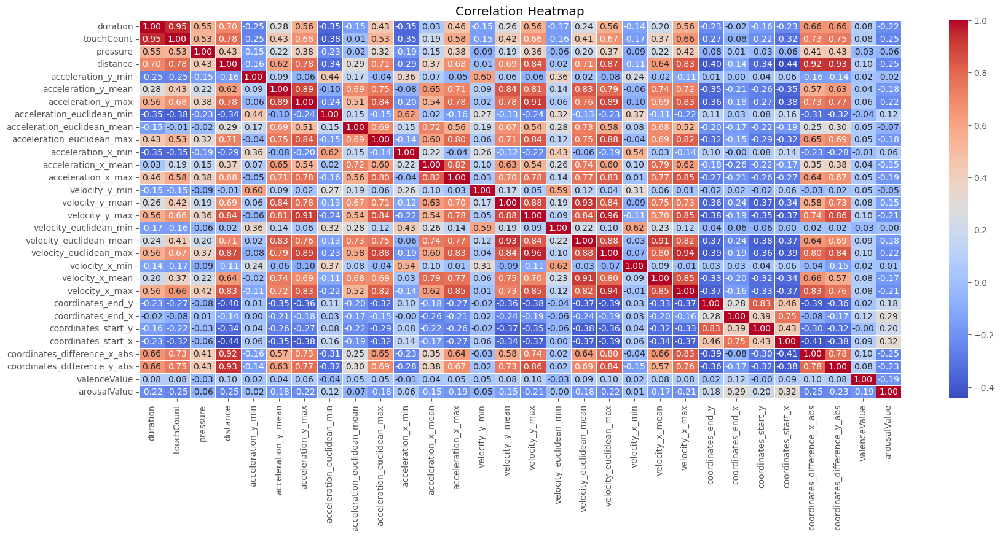

In [29]:
correlation_heatmap(df_ex)

In [30]:
X_features = df_ex.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df_ex[['valenceValue', 'arousalValue']]

In [31]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,0.083933,5.004645e-04,-0.222772,9.713514e-21
touchCount,0.078076,1.208538e-03,-0.252926,1.875212e-26
pressure,-0.034232,1.563529e-01,-0.063811,8.190115e-03
distance,0.097811,4.937751e-05,-0.249132,1.086556e-25
acceleration_y_min,0.017047,4.803751e-01,-0.019282,4.247371e-01
acceleration_y_mean,0.037253,1.229260e-01,-0.178936,8.184698e-14
acceleration_y_max,0.063470,8.539437e-03,-0.224153,5.533473e-21
acceleration_euclidean_min,-0.043462,7.186787e-02,0.119310,7.178065e-07
acceleration_euclidean_mean,0.050478,3.654143e-02,-0.068201,4.706994e-03
acceleration_euclidean_max,0.049689,3.958029e-02,-0.183208,2.031177e-14


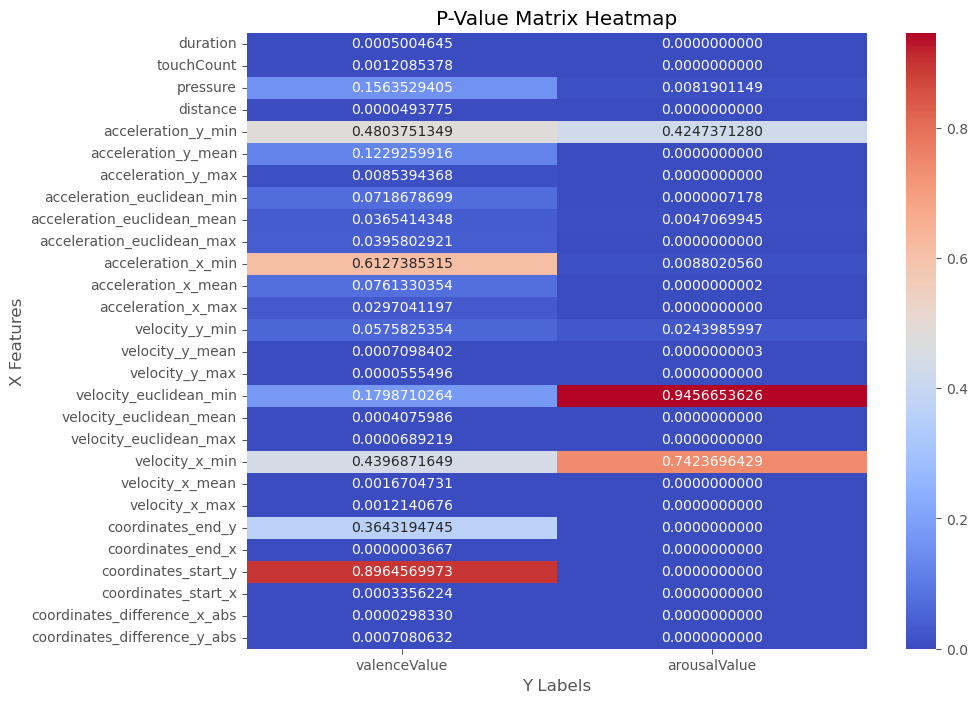

In [32]:
visualize_p_value_matrix(p_value)

In [33]:
# Getting Features with Significant Relationship (Valence)
whole_ex_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
whole_ex_val_sig

['duration',
 'touchCount',
 'distance',
 'acceleration_y_max',
 'acceleration_euclidean_mean',
 'acceleration_euclidean_max',
 'acceleration_x_max',
 'velocity_y_mean',
 'velocity_y_max',
 'velocity_euclidean_mean',
 'velocity_euclidean_max',
 'velocity_x_mean',
 'velocity_x_max',
 'coordinates_end_x',
 'coordinates_start_x',
 'coordinates_difference_x_abs',
 'coordinates_difference_y_abs']

In [34]:
# Save to text file
np.savetxt('whole_ex_val_sig.txt', whole_ex_val_sig, fmt='%s')

In [35]:
# Getting Features with Significant Relationship (Valence)
whole_ex_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
whole_ex_ars_sig

['duration',
 'touchCount',
 'pressure',
 'distance',
 'acceleration_y_mean',
 'acceleration_y_max',
 'acceleration_euclidean_min',
 'acceleration_euclidean_mean',
 'acceleration_euclidean_max',
 'acceleration_x_min',
 'acceleration_x_mean',
 'acceleration_x_max',
 'velocity_y_min',
 'velocity_y_mean',
 'velocity_y_max',
 'velocity_euclidean_mean',
 'velocity_euclidean_max',
 'velocity_x_mean',
 'velocity_x_max',
 'coordinates_end_y',
 'coordinates_end_x',
 'coordinates_start_y',
 'coordinates_start_x',
 'coordinates_difference_x_abs',
 'coordinates_difference_y_abs']

In [36]:
np.savetxt('whole_ex_ars_sig.txt', whole_ex_ars_sig, fmt='%s')

### Linearity Assumptions - No Extrapolation

In [37]:
check_linearity(df, whole_df_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,pressure,0.885567,Linear,0.410244,Linear
1,coordinates_end_x,0.890287,Linear,0.275663,Linear
2,coordinates_start_x,0.865208,Linear,0.271629,Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     4.352
Date:                Wed, 31 Jul 2024   Prob (F-statistic):            0.00467
Time:                        18:39:36   Log-Likelihood:                -1273.4
No. Observations:                1067   AIC:                             2555.
Df Residuals:                    1063   BIC:                             2575.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   2.3219    

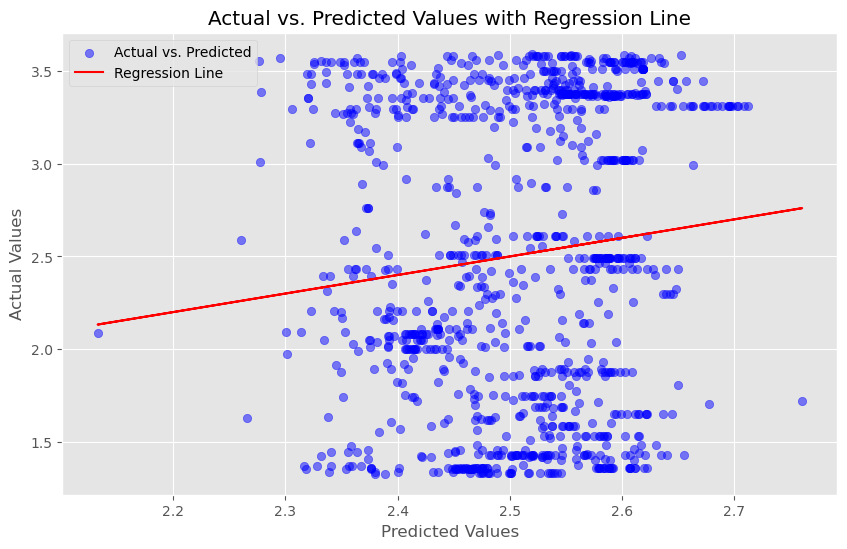

In [38]:
X = df[whole_df_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [39]:
check_linearity(df, whole_df_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,0.466927,Linear,0.718196,Linear
1,touchCount,0.437234,Linear,0.818833,Linear
2,distance,0.444141,Linear,0.687788,Linear
3,acceleration_y_mean,0.508461,Linear,0.656281,Linear
4,acceleration_y_max,0.485743,Linear,0.704459,Linear
5,acceleration_euclidean_min,0.492156,Linear,0.681105,Linear
6,acceleration_euclidean_max,0.427936,Linear,0.741342,Linear
7,acceleration_x_min,0.491314,Linear,0.631147,Linear
8,acceleration_x_mean,0.497343,Linear,0.673151,Linear
9,acceleration_x_max,0.484890,Linear,0.703858,Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.079
Model:                            OLS   Adj. R-squared:                  0.060
Method:                 Least Squares   F-statistic:                     4.262
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           6.08e-10
Time:                        18:39:36   Log-Likelihood:                -1686.8
No. Observations:                1067   AIC:                             3418.
Df Residuals:                    1045   BIC:                             3527.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

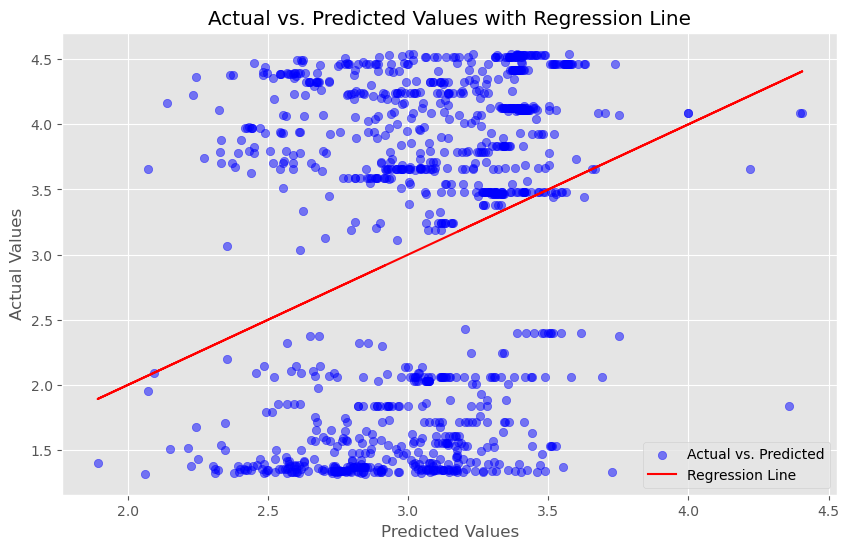

In [40]:
X = df[whole_df_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)

### Linearity Assumptions - With Extrapolation

In [41]:
check_linearity(df_ex, whole_ex_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,4.992009e-119,Not Linear,6.079484e-25,Not Linear
1,touchCount,6.234716e-119,Not Linear,6.819287e-25,Not Linear
2,distance,1.656643e-119,Not Linear,1.551928e-23,Not Linear
3,acceleration_y_max,1.921007e-118,Not Linear,2.032880e-23,Not Linear
4,acceleration_euclidean_mean,8.776041e-120,Not Linear,3.329046e-24,Not Linear
5,acceleration_euclidean_max,1.971033e-119,Not Linear,3.762335e-23,Not Linear
6,acceleration_x_max,3.045009e-119,Not Linear,1.412504e-23,Not Linear
7,velocity_y_mean,2.637351e-120,Not Linear,3.007358e-24,Not Linear
8,velocity_y_max,7.145007e-120,Not Linear,3.389802e-23,Not Linear
9,velocity_euclidean_mean,1.483455e-120,Not Linear,6.516138e-24,Not Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.042
Model:                            OLS   Adj. R-squared:                  0.026
Method:                 Least Squares   F-statistic:                     2.678
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           0.000253
Time:                        18:39:37   Log-Likelihood:                -1257.2
No. Observations:                1067   AIC:                             2550.
Df Residuals:                    1049   BIC:                             2640.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

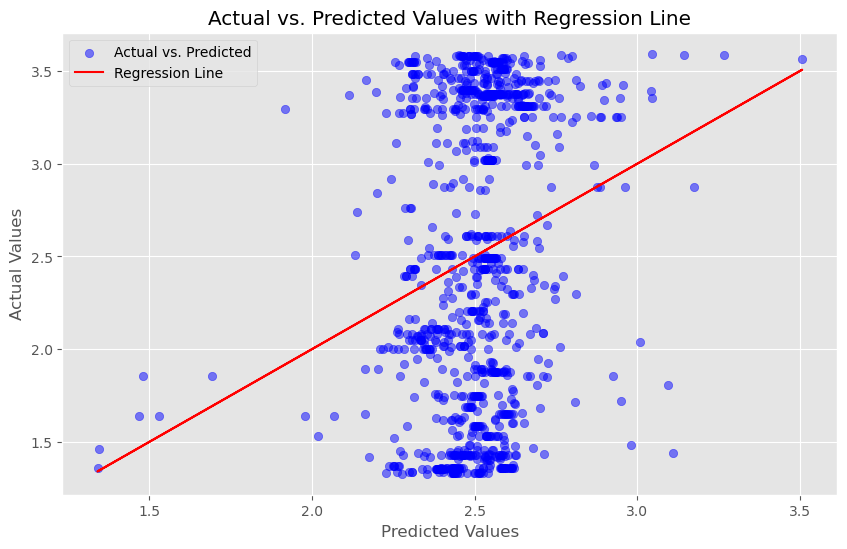

In [42]:
X = df[whole_ex_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [43]:
check_linearity(df_ex, whole_ex_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,0.473790,Linear,3.938122e-201,Not Linear
1,touchCount,0.485974,Linear,4.166179e-201,Not Linear
2,pressure,0.373090,Linear,2.004108e-202,Not Linear
3,distance,0.486207,Linear,1.113332e-201,Not Linear
4,acceleration_y_mean,0.283582,Linear,2.282530e-203,Not Linear
5,acceleration_y_max,0.328603,Linear,5.867697e-203,Not Linear
6,acceleration_euclidean_min,0.388573,Linear,1.344276e-202,Not Linear
7,acceleration_euclidean_mean,0.262869,Linear,9.082917e-203,Not Linear
8,acceleration_euclidean_max,0.384067,Linear,1.047149e-201,Not Linear
9,acceleration_x_min,0.385924,Linear,7.555936e-202,Not Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.082
Model:                            OLS   Adj. R-squared:                  0.059
Method:                 Least Squares   F-statistic:                     3.696
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           3.45e-09
Time:                        18:39:38   Log-Likelihood:                -1685.2
No. Observations:                1067   AIC:                             3422.
Df Residuals:                    1041   BIC:                             3552.
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

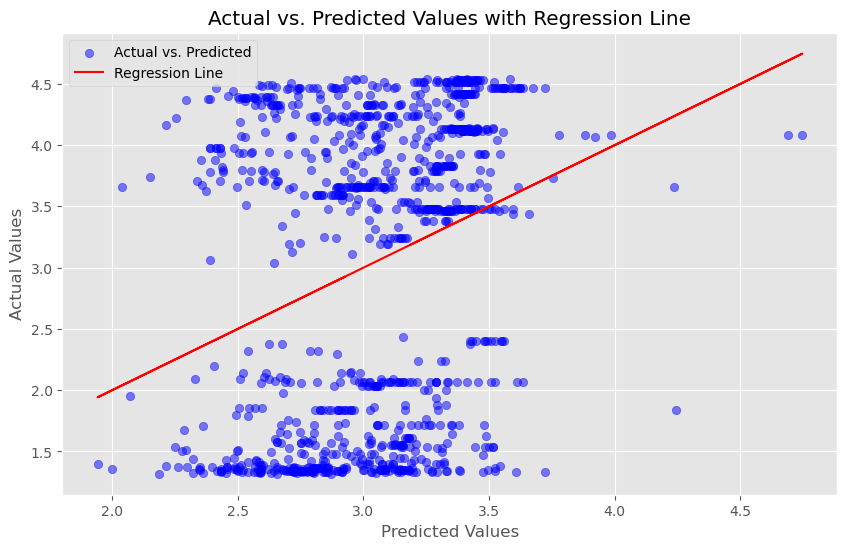

In [44]:
X = df[whole_ex_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)

## Quadrant 1 (High Valence - High Arousal)

### Getting the Datasets

In [45]:
df = pd.read_csv("q1.csv")
print_df(df)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,189.0,18,0.050980,7.468287,4.235585e-05,0.003297,0.032863,0.000049,0.001586,0.006262,0.000121,0.001611,0.007896,0.012379,0.060740,0.106315,0.033891,0.082642,0.130349,0.004839,0.050932,0.080163,1363.466980,813.569934,1357.453179,809.141672,4.428261,6.013802,3.374759,3.479655
1,89.0,10,0.039216,4.217842,1.045669e-03,0.006620,0.016570,0.000104,0.003140,0.011058,0.003246,0.019673,0.033147,0.000402,0.030244,0.106113,0.038700,0.093684,0.153388,0.020021,0.084661,0.139720,1399.002410,774.945655,1399.549223,779.127902,4.182247,0.546813,3.374759,3.479655
2,140.0,12,0.039216,8.933301,2.113276e-06,0.001692,0.007015,0.000045,0.002056,0.007286,0.000355,0.004293,0.017940,0.037817,0.062686,0.158626,0.057500,0.087165,0.162093,0.011297,0.040153,0.089492,1397.362313,770.271380,1390.255227,775.683699,5.412319,7.107086,3.374759,3.479655
3,89.0,5,0.027451,1.722102,9.725657e-03,0.005093,0.010647,0.002812,0.004490,0.009048,0.000088,0.003331,0.009048,0.028661,0.033782,0.106466,0.063336,0.072376,0.124334,0.063336,0.056318,0.097719,1491.394527,734.353261,1491.394527,732.631159,1.722102,0.000000,3.362531,3.463451
4,149.0,11,0.031373,2.050121,3.423366e-07,0.002472,0.009354,0.000053,0.002195,0.009057,0.001046,0.006033,0.010726,0.000010,0.033281,0.093535,0.029288,0.058962,0.119858,0.010144,0.042813,0.078543,1606.201299,779.127902,1604.561202,780.357975,1.230073,1.640097,3.548840,4.113125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,105.0,5,0.027451,0.546699,6.639810e-04,0.010271,0.035640,0.000728,0.009584,0.035640,0.000000,0.000276,0.000447,0.071280,0.033758,0.071280,0.071280,0.035295,0.071280,0.000000,0.007168,0.017916,1552.078106,312.438373,1552.624805,312.438373,0.000000,0.546699,3.547112,4.325685
227,139.0,12,0.058824,6.119671,4.027817e-05,0.001270,0.003232,0.000128,0.001425,0.003583,0.001622,0.009897,0.019618,0.000322,0.037025,0.085301,0.026003,0.068982,0.100690,0.014851,0.051084,0.086216,1456.952495,292.757212,1453.672301,297.923517,5.166305,3.280193,3.547112,4.325685
228,81.0,5,0.031373,1.319177,4.022284e-04,0.003349,0.009596,0.000441,0.000941,0.002110,0.000181,0.001654,0.003515,0.003843,0.014982,0.021486,0.019128,0.024116,0.036283,0.002633,0.013907,0.036079,1275.448341,811.847832,1276.541739,811.109789,0.738044,1.093398,3.510994,3.833378
229,413.0,37,0.027451,63.607775,6.502129e-04,0.006583,0.023768,0.000232,0.005550,0.023489,0.000000,0.010631,0.045940,0.023499,0.245859,0.729042,0.023499,0.260666,0.733432,0.000000,0.061090,0.187523,1375.494357,252.656875,1312.077169,257.577165,4.920290,63.417188,3.112545,3.705399


In [46]:
df_ex = pd.read_csv("q1-extrapolated.csv")
print_df(df_ex)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,189.000000,18.000000,0.050980,7.468287,0.000042,0.003297,0.032863,0.000049,0.001586,0.006262,0.000121,0.001611,0.007896,0.012379,0.060740,0.106315,0.033891,0.082642,0.130349,0.004839,0.050932,0.080163,1363.466980,813.569934,1357.453179,809.141672,4.428261,6.013802,3.374759,3.479655
1,135.261682,13.700935,0.044658,5.721553,0.000582,0.005083,0.024107,0.000078,0.002421,0.008839,0.001800,0.011317,0.021466,0.005943,0.044352,0.106207,0.036475,0.088576,0.142730,0.012997,0.069057,0.112168,1382.563123,792.813896,1380.074885,793.012777,4.296057,3.075934,3.374759,3.479655
2,92.813084,10.149533,0.039216,4.570400,0.000968,0.006251,0.015856,0.000099,0.003059,0.010776,0.003030,0.018523,0.032010,0.003199,0.032669,0.110040,0.040105,0.093197,0.154039,0.019368,0.081333,0.135964,1398.879786,774.596177,1398.854345,778.870391,4.274215,1.037301,3.374759,3.479655
3,120.219626,11.224299,0.039216,7.104408,0.000407,0.003603,0.010721,0.000068,0.002476,0.008749,0.001476,0.010258,0.023838,0.023306,0.050103,0.138259,0.050208,0.089693,0.158717,0.014680,0.057415,0.108973,1397.998426,772.084300,1393.859908,777.019535,4.935235,4.562681,3.374759,3.479655
4,132.373832,10.953271,0.037456,7.854991,0.001456,0.002201,0.007558,0.000459,0.002420,0.007549,0.000315,0.004149,0.016610,0.036448,0.058364,0.150826,0.058373,0.084953,0.156447,0.019079,0.042570,0.090722,1411.423205,764.900446,1405.378861,769.245936,4.860511,6.044344,3.372930,3.477232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
424,89.672897,6.046729,0.035477,2.037008,0.000348,0.003038,0.008645,0.000394,0.001014,0.002330,0.000396,0.002887,0.005923,0.003317,0.018278,0.031028,0.020156,0.030825,0.045914,0.004460,0.019467,0.043576,1302.589149,734.226805,1303.028552,734.371654,1.400213,1.420395,3.516395,3.906994
425,209.766355,17.411215,0.029852,25.477839,0.000498,0.004603,0.015093,0.000360,0.002729,0.010402,0.000111,0.005136,0.019970,0.011467,0.104528,0.295912,0.020824,0.115862,0.306673,0.001612,0.032207,0.094817,1314.251235,594.965358,1290.324172,596.421902,2.360130,25.265709,3.356455,3.783741
426,388.177570,34.607477,0.027744,58.950683,0.000632,0.006341,0.022708,0.000248,0.005206,0.021890,0.000014,0.009960,0.042768,0.022029,0.228597,0.676141,0.023172,0.242980,0.681309,0.000197,0.057562,0.176200,1368.014281,294.465545,1309.420314,298.962782,4.607599,58.757465,3.142335,3.714967
427,248.308411,21.271028,0.029265,34.547070,0.002818,0.004772,0.015241,0.001061,0.004340,0.014400,0.000815,0.007009,0.026465,0.057060,0.154337,0.436207,0.042846,0.178725,0.441210,0.015555,0.055715,0.130990,1403.905217,556.762344,1369.564052,559.151666,2.898840,34.341165,3.203507,4.056694


### Univariate Analysis - No Extrapolation

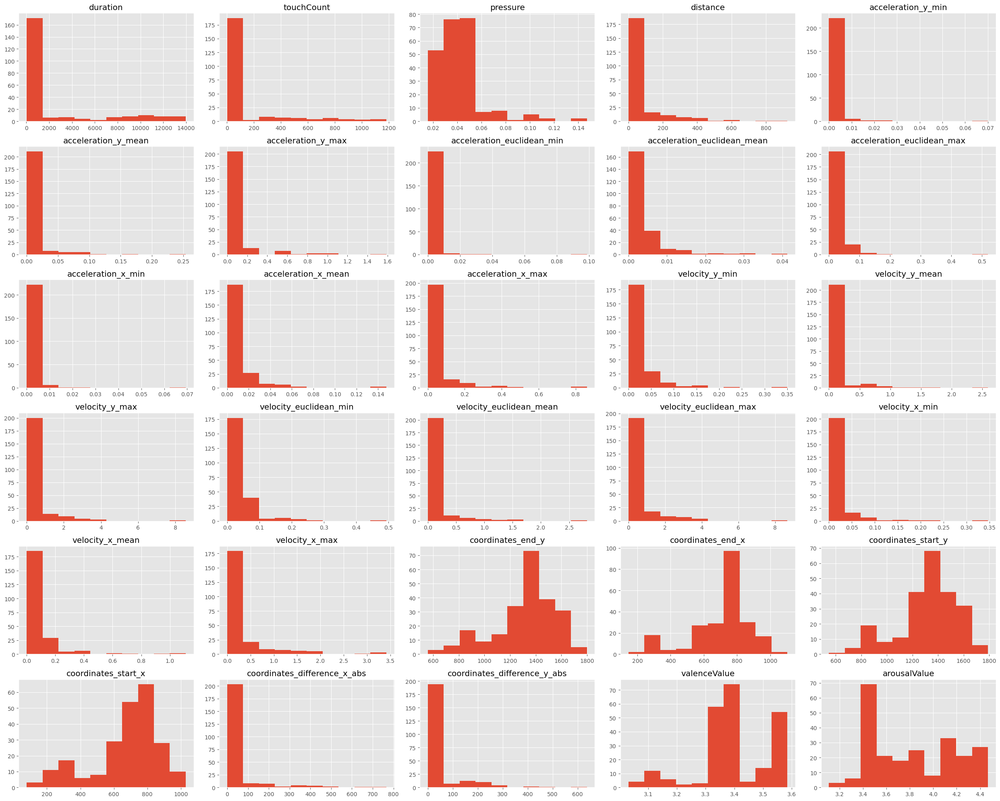

In [47]:
display_histogram(df)

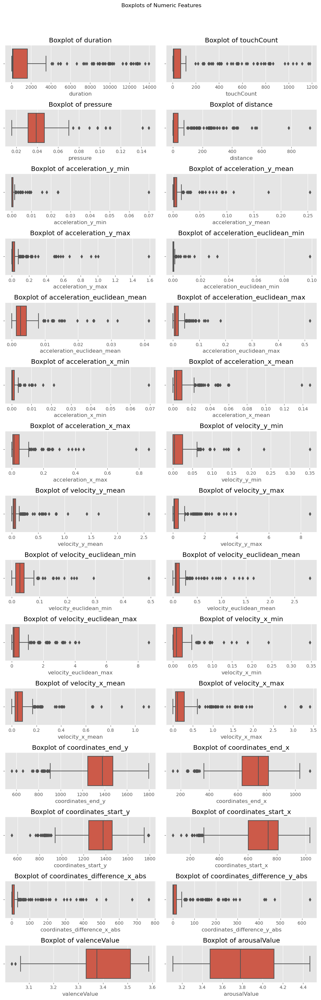

In [48]:
display_boxplot(df)

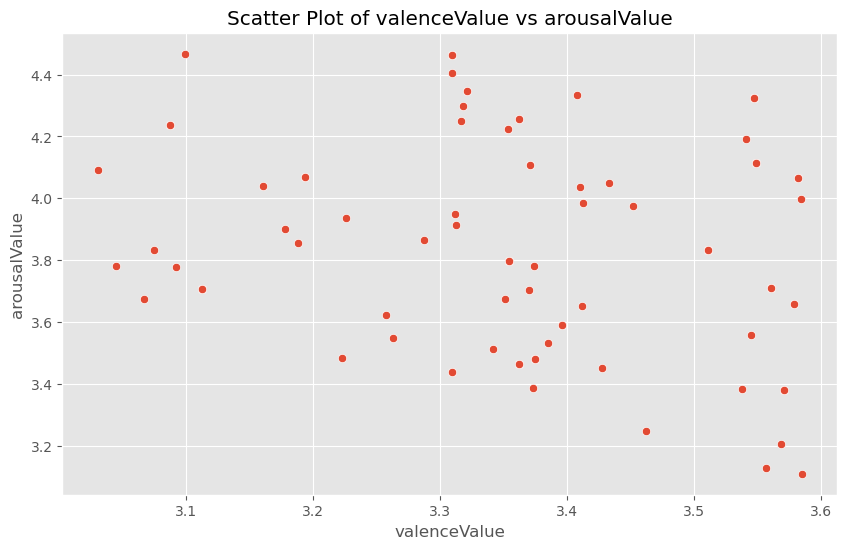

In [49]:
display_scatter_plot(df, 'valenceValue', 'arousalValue')

### Univariate Analysis - With Extrapolation

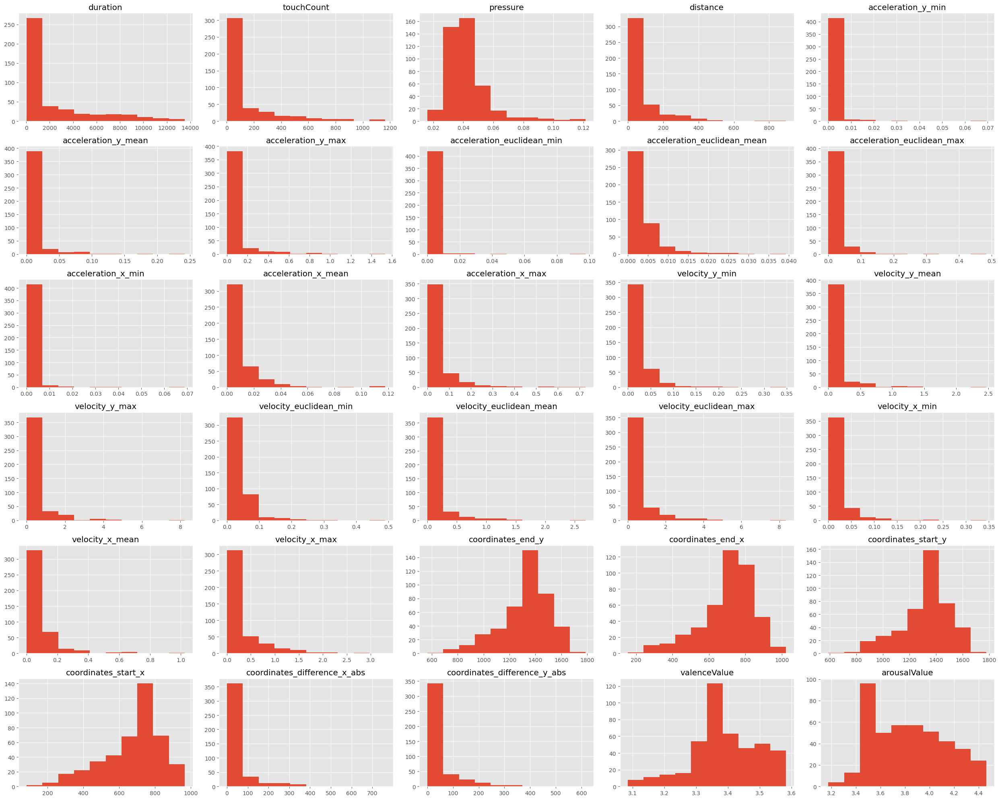

In [50]:
display_histogram(df_ex)

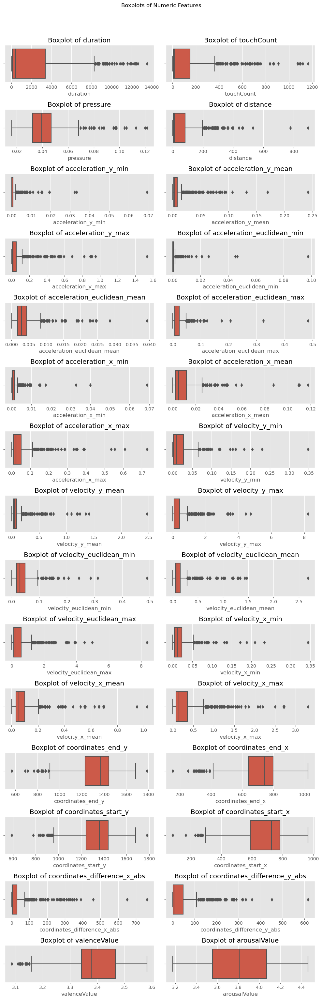

In [51]:
display_boxplot(df_ex)

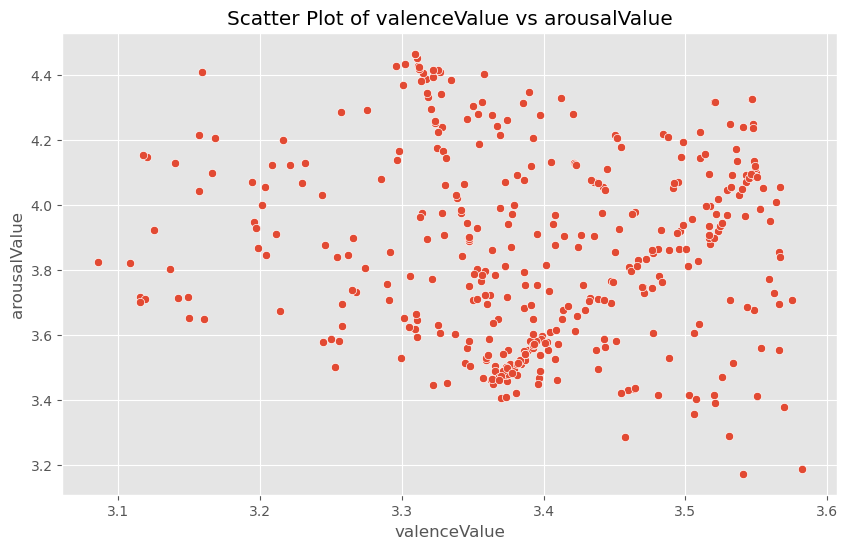

In [52]:
display_scatter_plot(df_ex, 'valenceValue', 'arousalValue')

### Bivariate Analysis - No Extrapolation

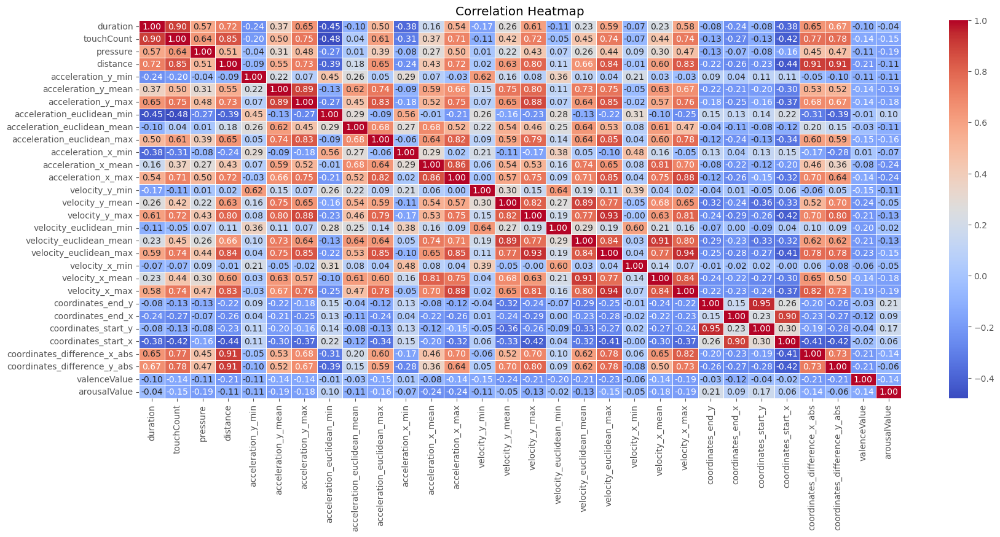

In [53]:
correlation_heatmap(df)

In [54]:
X_features = df.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df[['valenceValue', 'arousalValue']]

In [55]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,-0.099144,0.132997,-0.042497,0.520425
touchCount,-0.142335,0.030573,-0.145274,0.027264
pressure,-0.109417,0.097126,-0.192666,0.003282
distance,-0.213163,0.001115,-0.111970,0.089524
acceleration_y_min,-0.109034,0.098307,-0.110999,0.092357
acceleration_y_mean,-0.137022,0.037426,-0.192692,0.003278
acceleration_y_max,-0.144719,0.027864,-0.180879,0.005834
acceleration_euclidean_min,-0.005262,0.936599,0.101540,0.123832
acceleration_euclidean_mean,-0.026834,0.684965,-0.110522,0.093775
acceleration_euclidean_max,-0.145958,0.026539,-0.160183,0.014805


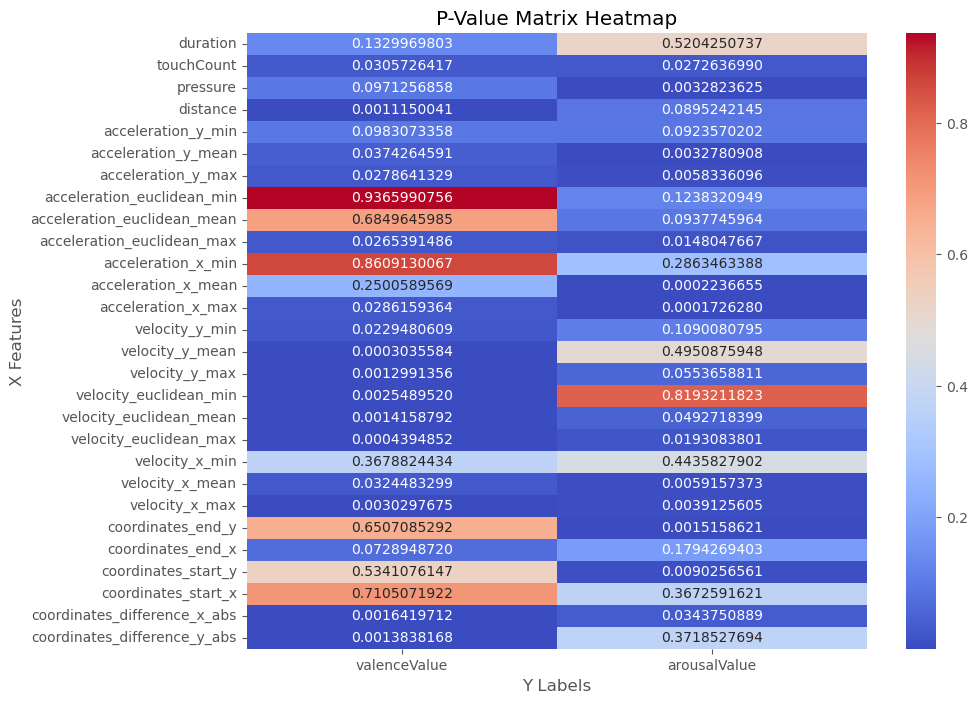

In [56]:
visualize_p_value_matrix(p_value)

In [57]:
# Getting Features with Significant Relationship (Valence)
q1_df_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
q1_df_val_sig

['touchCount',
 'distance',
 'acceleration_y_mean',
 'acceleration_y_max',
 'acceleration_euclidean_max',
 'acceleration_x_max',
 'velocity_y_min',
 'velocity_y_mean',
 'velocity_y_max',
 'velocity_euclidean_min',
 'velocity_euclidean_mean',
 'velocity_euclidean_max',
 'velocity_x_mean',
 'velocity_x_max',
 'coordinates_difference_x_abs',
 'coordinates_difference_y_abs']

In [58]:
# Save to text file
np.savetxt('q1_df_val_sig.txt', q1_df_val_sig, fmt='%s')

In [59]:
# Getting Features with Significant Relationship (Valence)
q1_df_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
q1_df_ars_sig

['touchCount',
 'pressure',
 'acceleration_y_mean',
 'acceleration_y_max',
 'acceleration_euclidean_max',
 'acceleration_x_mean',
 'acceleration_x_max',
 'velocity_euclidean_mean',
 'velocity_euclidean_max',
 'velocity_x_mean',
 'velocity_x_max',
 'coordinates_end_y',
 'coordinates_start_y',
 'coordinates_difference_x_abs']

In [60]:
np.savetxt('q1_df_ars_sig.txt', q1_df_ars_sig, fmt='%s')

### Bivariate Analysis - With Extrapolation

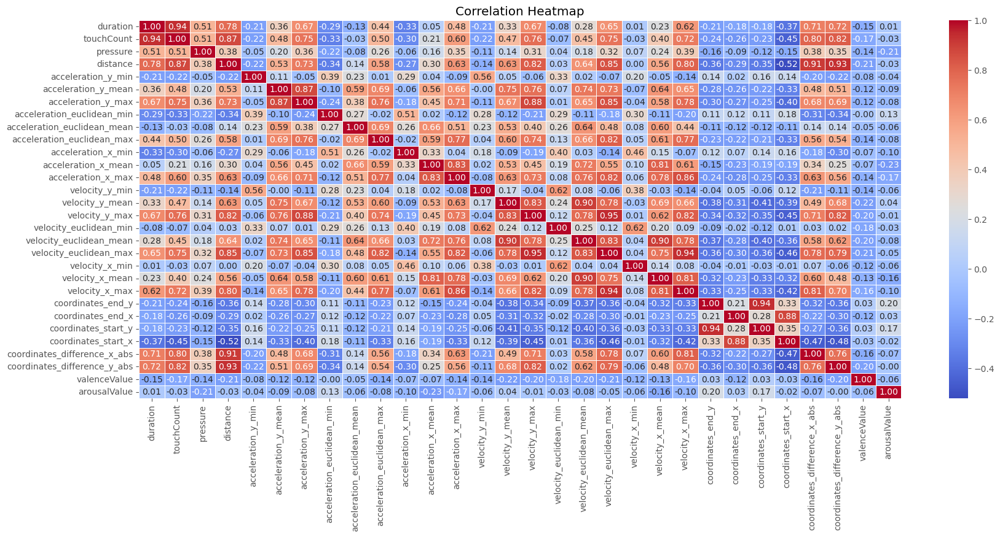

In [61]:
correlation_heatmap(df_ex)

In [62]:
X_features = df_ex.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df_ex[['valenceValue', 'arousalValue']]

In [63]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,-0.150830,0.001731,0.008196,8.655836e-01
touchCount,-0.170193,0.000399,-0.031582,5.141488e-01
pressure,-0.137574,0.004307,-0.210002,1.154850e-05
distance,-0.213252,0.000008,-0.026136,5.892946e-01
acceleration_y_min,-0.083210,0.085175,-0.042974,3.745907e-01
acceleration_y_mean,-0.119673,0.013124,-0.086054,7.499651e-02
acceleration_y_max,-0.123398,0.010522,-0.082657,8.727603e-02
acceleration_euclidean_min,-0.000544,0.991042,0.127848,8.020694e-03
acceleration_euclidean_mean,-0.048649,0.314761,-0.056723,2.410432e-01
acceleration_euclidean_max,-0.140058,0.003652,-0.081482,9.187973e-02


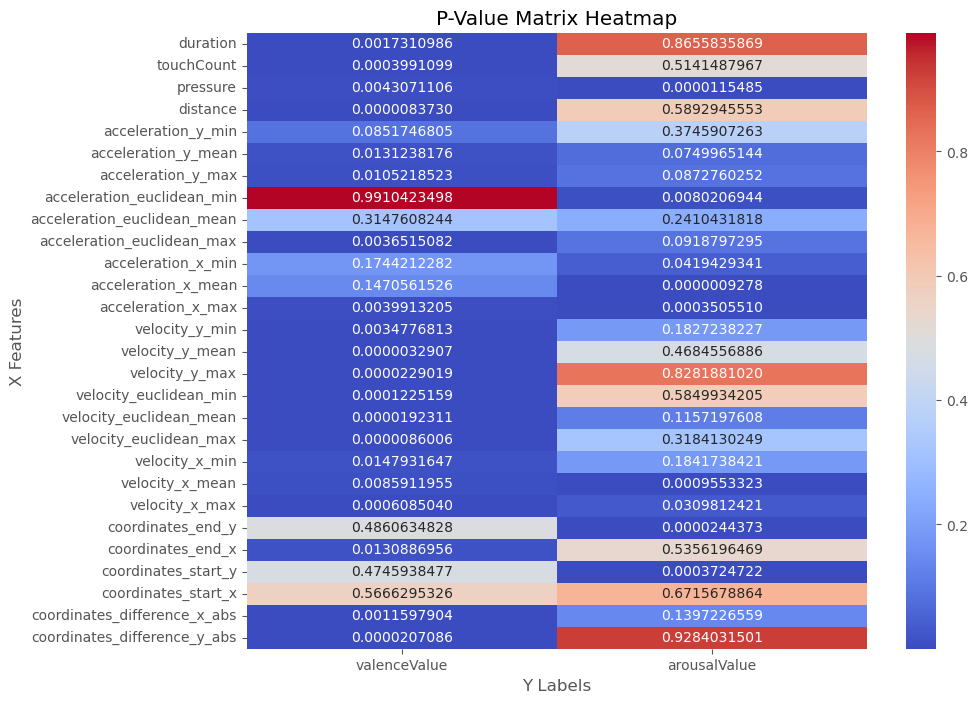

In [64]:
visualize_p_value_matrix(p_value)

In [65]:
# Getting Features with Significant Relationship (Valence)
q1_ex_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
q1_ex_val_sig

['duration',
 'touchCount',
 'pressure',
 'distance',
 'acceleration_y_mean',
 'acceleration_y_max',
 'acceleration_euclidean_max',
 'acceleration_x_max',
 'velocity_y_min',
 'velocity_y_mean',
 'velocity_y_max',
 'velocity_euclidean_min',
 'velocity_euclidean_mean',
 'velocity_euclidean_max',
 'velocity_x_min',
 'velocity_x_mean',
 'velocity_x_max',
 'coordinates_end_x',
 'coordinates_difference_x_abs',
 'coordinates_difference_y_abs']

In [66]:
# Save to text file
np.savetxt('q1_ex_val_sig.txt', q1_ex_val_sig, fmt='%s')

In [67]:
# Getting Features with Significant Relationship (Valence)
q1_ex_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
q1_ex_ars_sig

['pressure',
 'acceleration_euclidean_min',
 'acceleration_x_min',
 'acceleration_x_mean',
 'acceleration_x_max',
 'velocity_x_mean',
 'velocity_x_max',
 'coordinates_end_y',
 'coordinates_start_y']

In [68]:
np.savetxt('q1_ex_ars_sig.txt', q1_ex_ars_sig, fmt='%s')

### Linearity Assumptions - No Extrapolation

In [69]:
check_linearity(df, q1_df_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,touchCount,0.294297,Linear,0.277292,Linear
1,distance,0.241876,Linear,0.594279,Linear
2,acceleration_y_mean,0.269360,Linear,0.527638,Linear
3,acceleration_y_max,0.247068,Linear,0.531598,Linear
4,acceleration_euclidean_max,0.231958,Linear,0.319529,Linear
5,acceleration_x_max,0.251014,Linear,0.348603,Linear
6,velocity_y_min,0.271261,Linear,0.658552,Linear
7,velocity_y_mean,0.240013,Linear,0.525577,Linear
8,velocity_y_max,0.244615,Linear,0.441848,Linear
9,velocity_euclidean_min,0.302477,Linear,0.664580,Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.233
Model:                            OLS   Adj. R-squared:                  0.176
Method:                 Least Squares   F-statistic:                     4.072
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           8.71e-07
Time:                        18:39:58   Log-Likelihood:                 177.92
No. Observations:                 231   AIC:                            -321.8
Df Residuals:                     214   BIC:                            -263.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

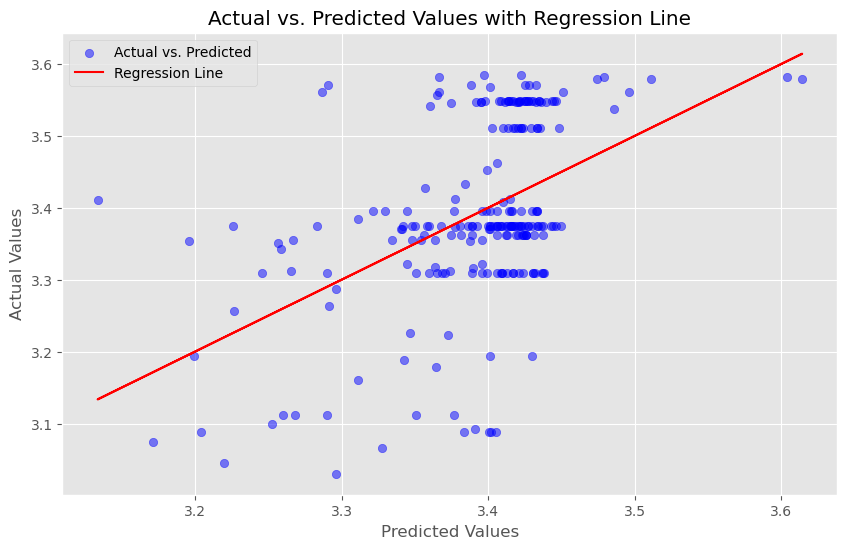

In [70]:
X = df[q1_df_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [71]:
check_linearity(df, q1_df_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,touchCount,0.814852,Linear,0.394945,Linear
1,pressure,0.820856,Linear,0.518260,Linear
2,acceleration_y_mean,0.791659,Linear,0.449856,Linear
3,acceleration_y_max,0.823242,Linear,0.412964,Linear
4,acceleration_euclidean_max,0.764107,Linear,0.360976,Linear
5,acceleration_x_mean,0.785981,Linear,0.380321,Linear
6,acceleration_x_max,0.821129,Linear,0.386461,Linear
7,velocity_euclidean_mean,0.823620,Linear,0.427784,Linear
8,velocity_euclidean_max,0.812678,Linear,0.400368,Linear
9,velocity_x_mean,0.828463,Linear,0.340653,Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.180
Model:                            OLS   Adj. R-squared:                  0.127
Method:                 Least Squares   F-statistic:                     3.385
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           5.91e-05
Time:                        18:39:58   Log-Likelihood:                -71.697
No. Observations:                 231   AIC:                             173.4
Df Residuals:                     216   BIC:                             225.0
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

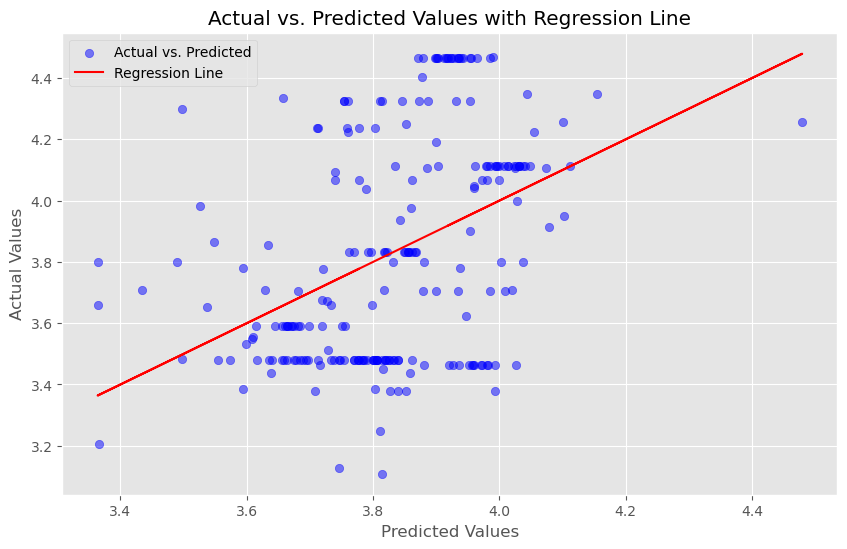

In [72]:
X = df[q1_df_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)

### Linearity Assumptions - With Extrapolation

In [73]:
check_linearity(df_ex, q1_ex_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,0.442684,Linear,0.115355,Linear
1,touchCount,0.471945,Linear,0.070970,Linear
2,pressure,0.454629,Linear,0.456543,Linear
3,distance,0.388837,Linear,0.381565,Linear
4,acceleration_y_mean,0.412694,Linear,0.342725,Linear
5,acceleration_y_max,0.372978,Linear,0.298440,Linear
6,acceleration_euclidean_max,0.380938,Linear,0.084912,Linear
7,acceleration_x_max,0.420201,Linear,0.089121,Linear
8,velocity_y_min,0.455427,Linear,0.434647,Linear
9,velocity_y_mean,0.390762,Linear,0.256475,Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.256
Model:                            OLS   Adj. R-squared:                  0.186
Method:                 Least Squares   F-statistic:                     3.620
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           1.27e-06
Time:                        18:39:58   Log-Likelihood:                 181.44
No. Observations:                 231   AIC:                            -320.9
Df Residuals:                     210   BIC:                            -248.6
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

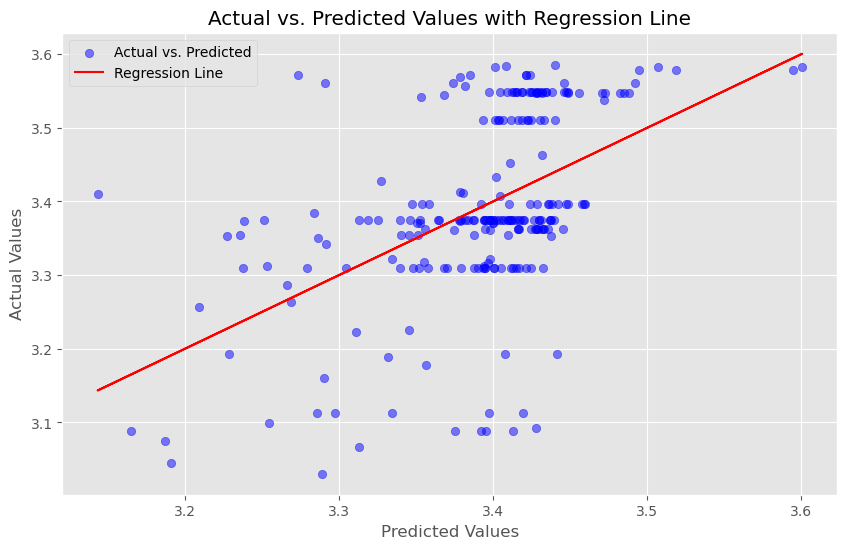

In [74]:
X = df[q1_ex_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [75]:
check_linearity(df_ex, q1_ex_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,pressure,0.866545,Linear,0.295119,Linear
1,acceleration_euclidean_min,0.809378,Linear,0.256464,Linear
2,acceleration_x_min,0.627935,Linear,0.152127,Linear
3,acceleration_x_mean,0.759771,Linear,0.203679,Linear
4,acceleration_x_max,0.745298,Linear,0.234343,Linear
5,velocity_x_mean,0.814327,Linear,0.130266,Linear
6,velocity_x_max,0.686861,Linear,0.176021,Linear
7,coordinates_end_y,0.899629,Linear,0.369222,Linear
8,coordinates_start_y,0.915930,Linear,0.339951,Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.141
Model:                            OLS   Adj. R-squared:                  0.106
Method:                 Least Squares   F-statistic:                     4.018
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           8.88e-05
Time:                        18:39:59   Log-Likelihood:                -77.101
No. Observations:                 231   AIC:                             174.2
Df Residuals:                     221   BIC:                             208.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

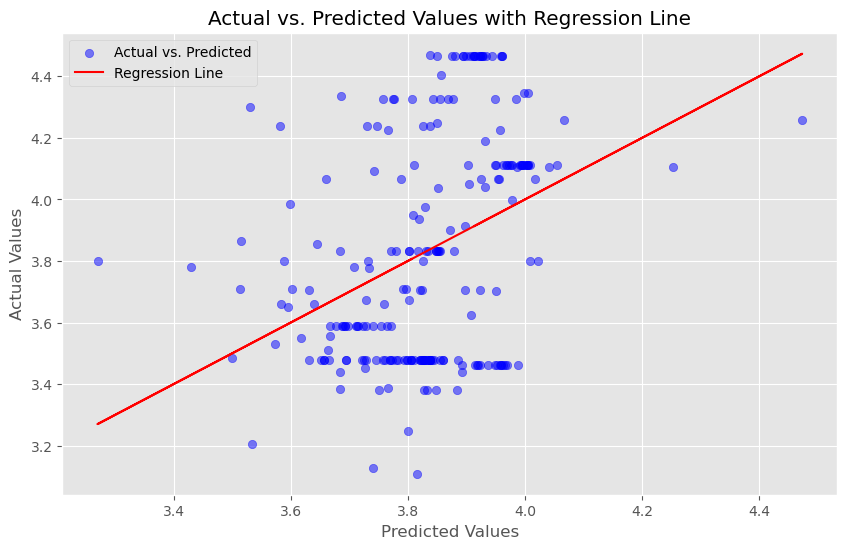

In [76]:
X = df[q1_ex_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)

## Quadrant 2 (Low Valence - High Arousal)

### Getting the Datasets

In [77]:
df = pd.read_csv("q2.csv")
print_df(df)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,7747.0,176,0.047059,204.035739,1.421211e-02,1.553618e-02,0.321783,0.019224,0.005418,0.071771,0.012945,0.003132,0.024216,0.213182,0.170653,2.282534,0.288355,0.206120,2.397167,0.194171,0.087846,0.732437,1133.634870,555.154525,1240.933644,381.610421,173.544104,107.298774,1.927521,4.028455
1,630.0,75,0.039216,177.046959,7.827766e-07,1.261514e-01,0.756964,0.000094,0.027900,0.163932,0.001979,0.237025,1.062971,0.012689,1.052703,3.938388,0.130038,2.015998,5.677990,0.024006,1.510933,4.277146,978.044245,384.274639,926.107848,553.532538,169.257899,51.936397,2.080609,4.516339
2,1002.0,117,0.031373,178.182412,5.279109e-05,2.108566e-02,0.140554,0.000045,0.005024,0.036233,0.000226,0.038196,0.154877,0.001284,0.286433,0.762565,0.004571,0.567963,1.046224,0.004387,0.443950,0.915880,1295.676201,625.860804,1172.668945,496.949257,128.911547,123.007256,1.619024,4.407545
3,128.0,8,0.027451,1.120733,5.331510e-04,9.926252e-03,0.036201,0.000533,0.006230,0.015951,0.010972,0.005375,0.014823,0.003011,0.048139,0.162300,0.017594,0.066327,0.177958,0.076806,0.033907,0.076806,1693.126426,725.250724,1692.033029,725.496738,0.246015,1.093398,3.018497,4.420282
4,1361.0,115,0.062745,112.922952,2.138582e-04,2.995973e-02,0.118579,0.000007,0.002284,0.013531,0.000032,0.006039,0.025590,0.000596,0.129118,0.479721,0.008132,0.149931,0.525460,0.002302,0.063522,0.224187,1370.574066,743.455798,1479.367151,713.195956,30.259842,108.793084,1.417938,2.240868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
424,107.0,5,0.027451,2.042636,0.000000e+00,4.152304e-07,0.000001,0.000887,0.002377,0.003547,0.000887,0.002377,0.003547,0.000000,0.000006,0.000022,0.000000,0.025033,0.068209,0.000000,0.025033,0.068209,1661.417889,722.544564,1660.871190,724.512680,1.968116,0.546699,3.018497,4.420282
425,181.0,16,0.031373,19.779322,1.040185e-03,4.101737e-02,0.217424,0.000140,0.005342,0.016771,0.000080,0.005028,0.023153,0.005201,0.161196,0.460262,0.016824,0.175281,0.470194,0.009248,0.046943,0.129285,1641.190029,719.346376,1660.871190,721.314492,1.968116,19.681161,2.491841,4.127555
426,531.0,64,0.054902,528.650896,1.331808e-04,9.394847e-03,0.023683,0.000294,0.013812,0.039614,0.001278,0.187840,0.510399,0.050849,0.784005,1.493019,0.063152,1.118502,2.526632,0.025566,0.772193,2.044872,1486.474236,343.682216,1110.345269,715.164072,371.481856,376.128968,1.894761,3.661365
427,108.0,7,0.043137,0.918470,9.960401e-08,2.533121e-04,0.001213,0.000002,0.001427,0.004454,0.000548,0.001878,0.004781,0.000079,0.006680,0.020482,0.031675,0.049866,0.074025,0.031675,0.048796,0.071469,1470.619968,792.412686,1470.073269,791.674642,0.738044,0.546699,1.358450,4.532387


In [78]:
df_ex = pd.read_csv("q2-extrapolated.csv")
print_df(df_ex)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,7747.0,176,0.047059,204.035739,1.421211e-02,1.553618e-02,0.321783,0.019224,0.005418,0.071771,0.012945,0.003132,0.024216,0.213182,0.170653,2.282534,0.288355,0.206120,2.397167,0.194171,0.087846,0.732437,1133.634870,555.154525,1240.933644,381.610421,173.544104,107.298774,1.927521,4.028455
1,630.0,75,0.039216,177.046959,7.827766e-07,1.261514e-01,0.756964,0.000094,0.027900,0.163932,0.001979,0.237025,1.062971,0.012689,1.052703,3.938388,0.130038,2.015998,5.677990,0.024006,1.510933,4.277146,978.044245,384.274639,926.107848,553.532538,169.257899,51.936397,2.080609,4.516339
2,1002.0,117,0.031373,178.182412,5.279109e-05,2.108566e-02,0.140554,0.000045,0.005024,0.036233,0.000226,0.038196,0.154877,0.001284,0.286433,0.762565,0.004571,0.567963,1.046224,0.004387,0.443950,0.915880,1295.676201,625.860804,1172.668945,496.949257,128.911547,123.007256,1.619024,4.407545
3,128.0,8,0.027451,1.120733,5.331510e-04,9.926252e-03,0.036201,0.000533,0.006230,0.015951,0.010972,0.005375,0.014823,0.003011,0.048139,0.162300,0.017594,0.066327,0.177958,0.076806,0.033907,0.076806,1693.126426,725.250724,1692.033029,725.496738,0.246015,1.093398,3.018497,4.420282
4,1361.0,115,0.062745,112.922952,2.138582e-04,2.995973e-02,0.118579,0.000007,0.002284,0.013531,0.000032,0.006039,0.025590,0.000596,0.129118,0.479721,0.008132,0.149931,0.525460,0.002302,0.063522,0.224187,1370.574066,743.455798,1479.367151,713.195956,30.259842,108.793084,1.417938,2.240868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
424,107.0,5,0.027451,2.042636,0.000000e+00,4.152304e-07,0.000001,0.000887,0.002377,0.003547,0.000887,0.002377,0.003547,0.000000,0.000006,0.000022,0.000000,0.025033,0.068209,0.000000,0.025033,0.068209,1661.417889,722.544564,1660.871190,724.512680,1.968116,0.546699,3.018497,4.420282
425,181.0,16,0.031373,19.779322,1.040185e-03,4.101737e-02,0.217424,0.000140,0.005342,0.016771,0.000080,0.005028,0.023153,0.005201,0.161196,0.460262,0.016824,0.175281,0.470194,0.009248,0.046943,0.129285,1641.190029,719.346376,1660.871190,721.314492,1.968116,19.681161,2.491841,4.127555
426,531.0,64,0.054902,528.650896,1.331808e-04,9.394847e-03,0.023683,0.000294,0.013812,0.039614,0.001278,0.187840,0.510399,0.050849,0.784005,1.493019,0.063152,1.118502,2.526632,0.025566,0.772193,2.044872,1486.474236,343.682216,1110.345269,715.164072,371.481856,376.128968,1.894761,3.661365
427,108.0,7,0.043137,0.918470,9.960401e-08,2.533121e-04,0.001213,0.000002,0.001427,0.004454,0.000548,0.001878,0.004781,0.000079,0.006680,0.020482,0.031675,0.049866,0.074025,0.031675,0.048796,0.071469,1470.619968,792.412686,1470.073269,791.674642,0.738044,0.546699,1.358450,4.532387


### Univariate Analysis - No Extrapolation

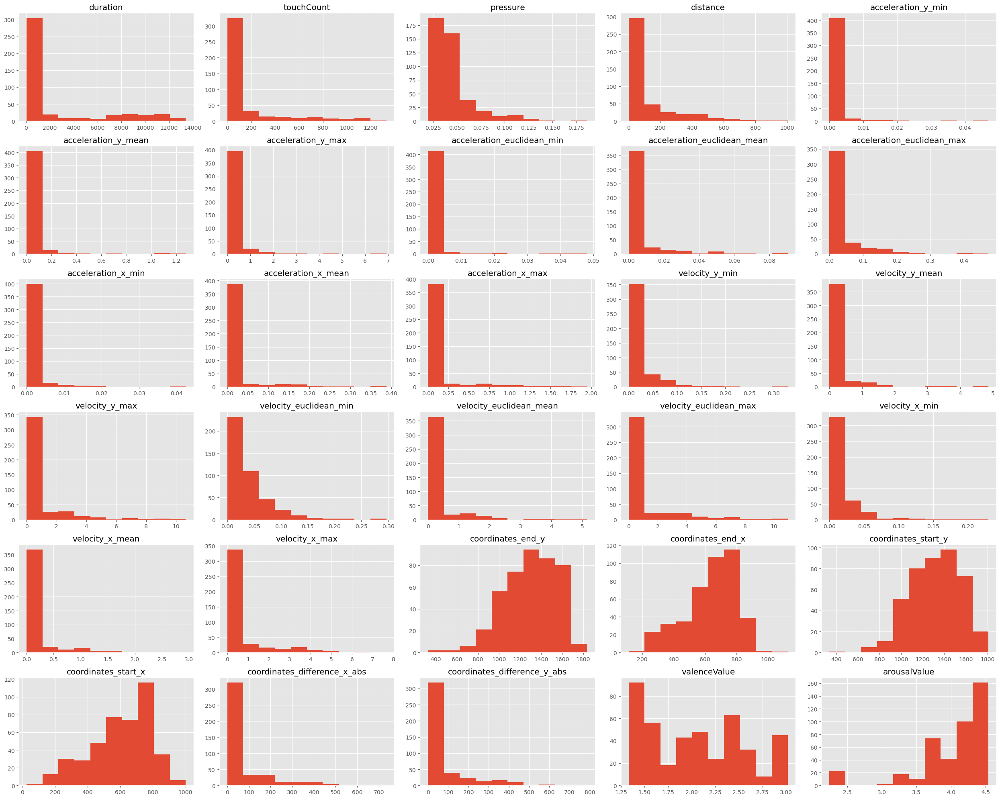

In [79]:
display_histogram(df)

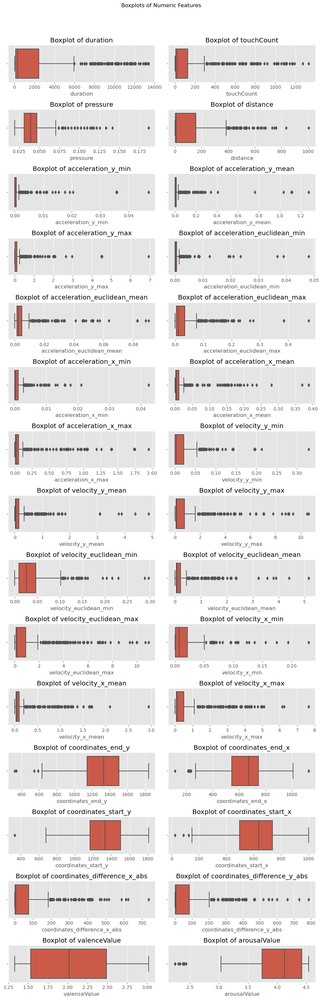

In [80]:
display_boxplot(df)

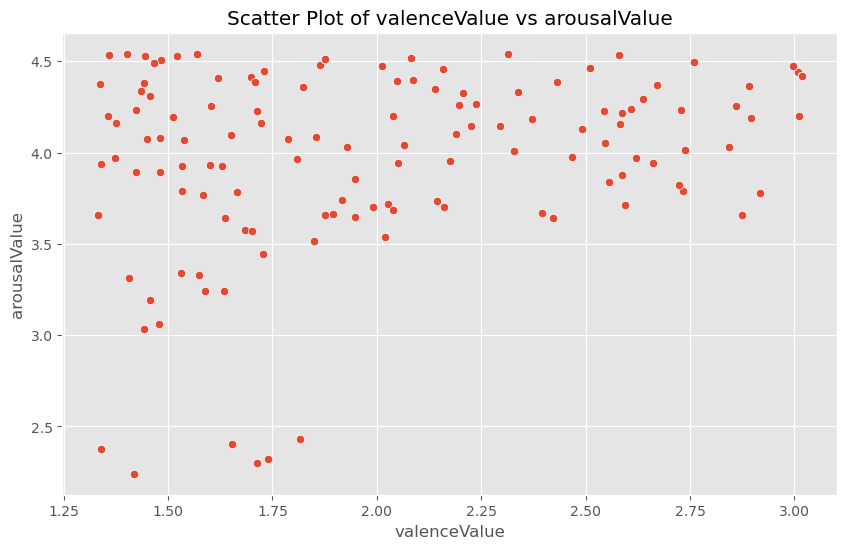

In [81]:
display_scatter_plot(df, 'valenceValue', 'arousalValue')

### Univariate Analysis - With Extrapolation

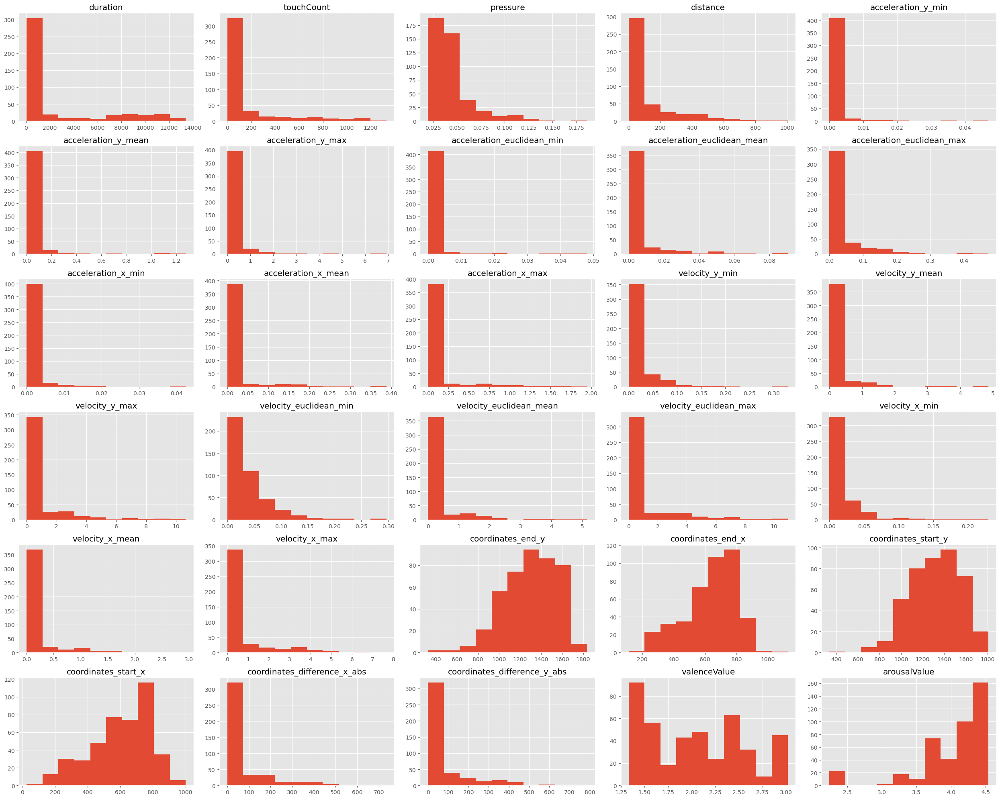

In [82]:
display_histogram(df_ex)

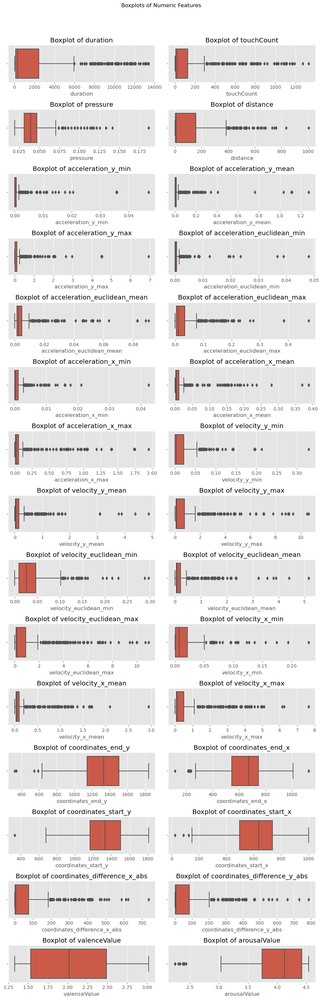

In [83]:
display_boxplot(df_ex)

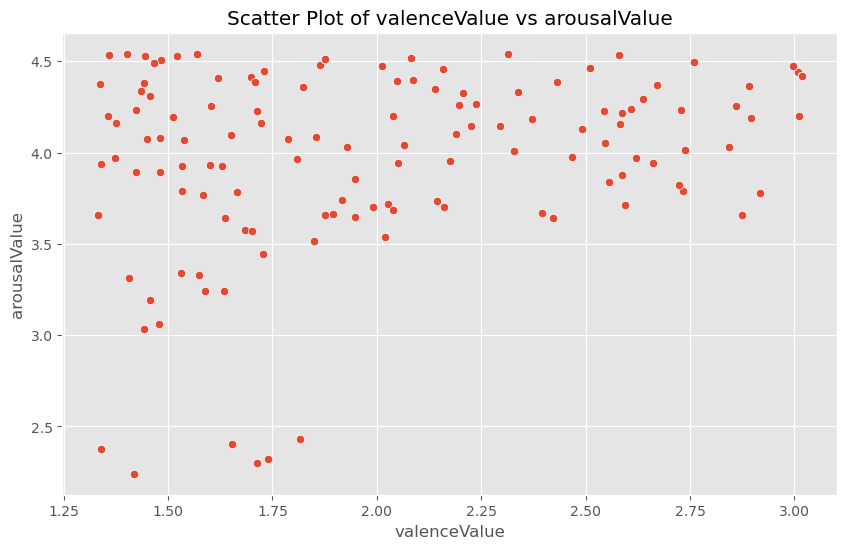

In [84]:
display_scatter_plot(df_ex, 'valenceValue', 'arousalValue')

### Bivariate Analysis - No Extrapolation

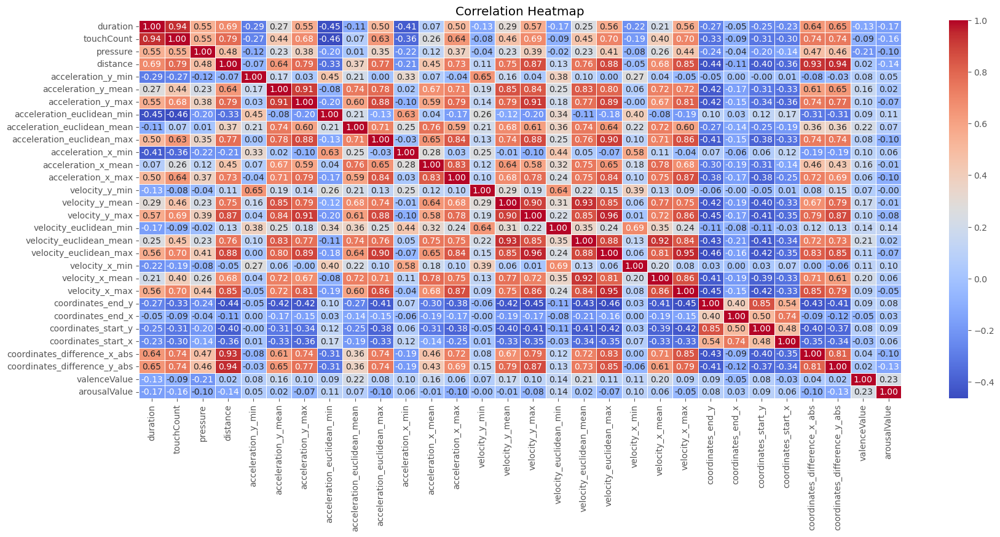

In [85]:
correlation_heatmap(df)

In [86]:
X_features = df.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df[['valenceValue', 'arousalValue']]

In [87]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,-0.134586,0.005236,-0.166232,0.000546
touchCount,-0.087216,0.071136,-0.155957,0.001193
pressure,-0.210188,0.000011,-0.104907,0.029815
distance,0.020756,0.668147,-0.140437,0.003560
acceleration_y_min,0.075353,0.119140,0.054324,0.261554
acceleration_y_mean,0.156653,0.001133,0.018955,0.695434
acceleration_y_max,0.098744,0.040929,-0.070924,0.142497
acceleration_euclidean_min,0.085770,0.075966,0.105159,0.029422
acceleration_euclidean_mean,0.221099,0.000004,0.073891,0.126493
acceleration_euclidean_max,0.081881,0.090293,-0.098638,0.041147


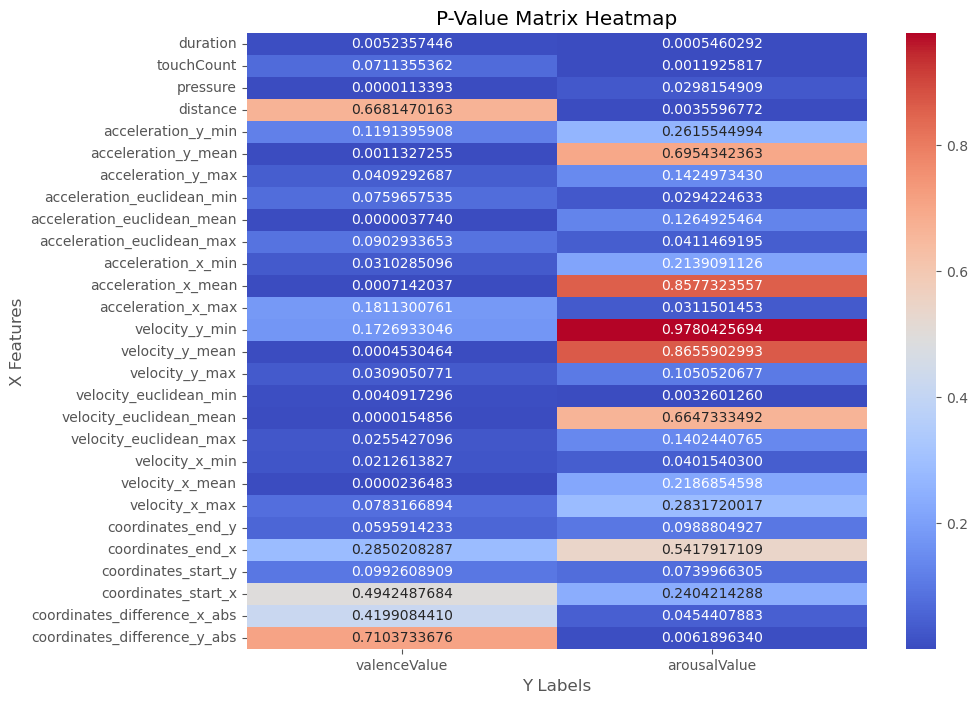

In [88]:
visualize_p_value_matrix(p_value)

In [89]:
# Getting Features with Significant Relationship (Valence)
q2_df_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
q2_df_val_sig

['duration',
 'pressure',
 'acceleration_y_mean',
 'acceleration_y_max',
 'acceleration_euclidean_mean',
 'acceleration_x_min',
 'acceleration_x_mean',
 'velocity_y_mean',
 'velocity_y_max',
 'velocity_euclidean_min',
 'velocity_euclidean_mean',
 'velocity_euclidean_max',
 'velocity_x_min',
 'velocity_x_mean']

In [90]:
# Save to text file
np.savetxt('q2_df_val_sig.txt', q2_df_val_sig, fmt='%s')

In [91]:
# Getting Features with Significant Relationship (Valence)
q2_df_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
q2_df_ars_sig

['duration',
 'touchCount',
 'pressure',
 'distance',
 'acceleration_euclidean_min',
 'acceleration_euclidean_max',
 'acceleration_x_max',
 'velocity_euclidean_min',
 'velocity_x_min',
 'coordinates_difference_x_abs',
 'coordinates_difference_y_abs']

In [92]:
np.savetxt('q2_df_ars_sig.txt', q2_df_ars_sig, fmt='%s')

### Bivariate Analysis - With Extrapolation

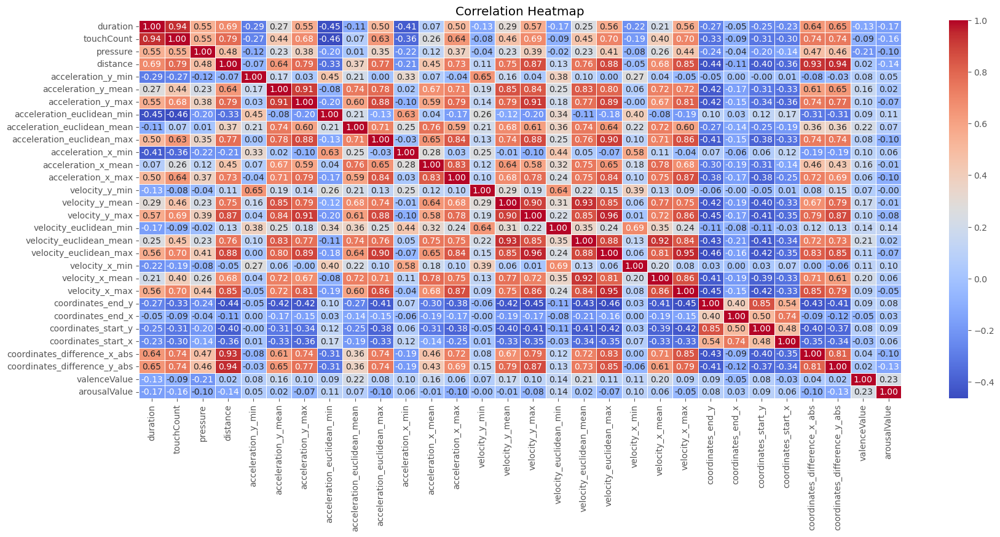

In [93]:
correlation_heatmap(df_ex)

In [94]:
X_features = df_ex.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df_ex[['valenceValue', 'arousalValue']]

In [95]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,-0.134586,0.005236,-0.166232,0.000546
touchCount,-0.087216,0.071136,-0.155957,0.001193
pressure,-0.210188,0.000011,-0.104907,0.029815
distance,0.020756,0.668147,-0.140437,0.003560
acceleration_y_min,0.075353,0.119140,0.054324,0.261554
acceleration_y_mean,0.156653,0.001133,0.018955,0.695434
acceleration_y_max,0.098744,0.040929,-0.070924,0.142497
acceleration_euclidean_min,0.085770,0.075966,0.105159,0.029422
acceleration_euclidean_mean,0.221099,0.000004,0.073891,0.126493
acceleration_euclidean_max,0.081881,0.090293,-0.098638,0.041147


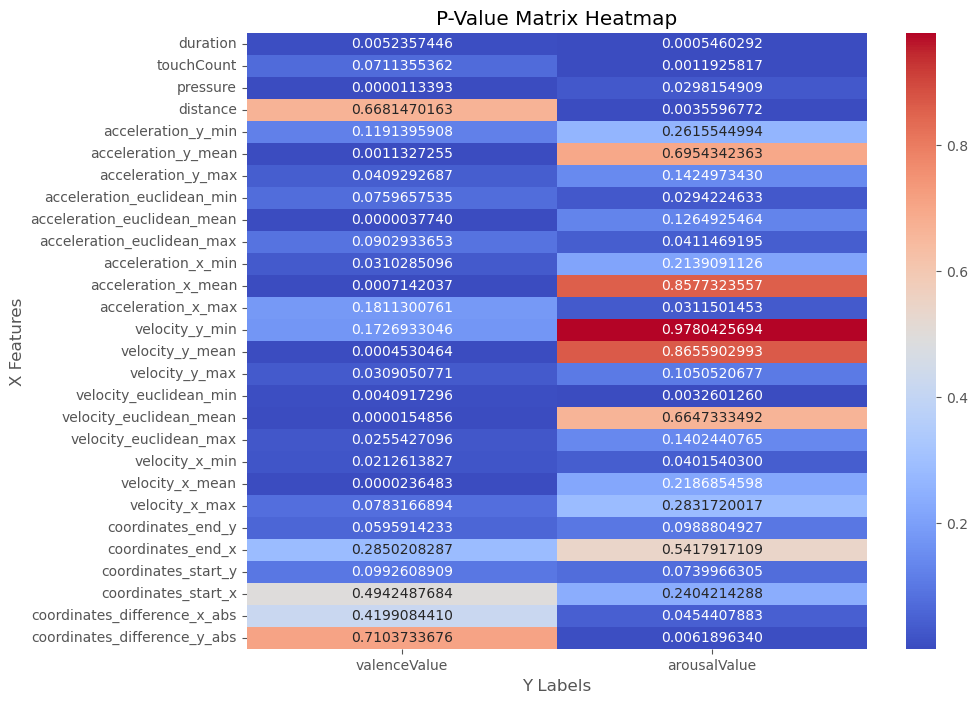

In [96]:
visualize_p_value_matrix(p_value)

In [97]:
# Getting Features with Significant Relationship (Valence)
q2_ex_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
q2_ex_val_sig

['duration',
 'pressure',
 'acceleration_y_mean',
 'acceleration_y_max',
 'acceleration_euclidean_mean',
 'acceleration_x_min',
 'acceleration_x_mean',
 'velocity_y_mean',
 'velocity_y_max',
 'velocity_euclidean_min',
 'velocity_euclidean_mean',
 'velocity_euclidean_max',
 'velocity_x_min',
 'velocity_x_mean']

In [98]:
# Save to text file
np.savetxt('q2_ex_val_sig.txt', q2_ex_val_sig, fmt='%s')

In [99]:
# Getting Features with Significant Relationship (Valence)
q2_ex_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
q2_ex_ars_sig

['duration',
 'touchCount',
 'pressure',
 'distance',
 'acceleration_euclidean_min',
 'acceleration_euclidean_max',
 'acceleration_x_max',
 'velocity_euclidean_min',
 'velocity_x_min',
 'coordinates_difference_x_abs',
 'coordinates_difference_y_abs']

In [100]:
np.savetxt('q2_ex_ars_sig.txt', q2_ex_ars_sig, fmt='%s')

### Linearity Assumptions - No Extrapolation

In [101]:
check_linearity(df, q2_df_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,0.797520,Linear,0.853485,Linear
1,pressure,0.839266,Linear,0.699965,Linear
2,acceleration_y_mean,0.792225,Linear,0.833438,Linear
3,acceleration_y_max,0.800734,Linear,0.836607,Linear
4,acceleration_euclidean_mean,0.723294,Linear,0.842351,Linear
5,acceleration_x_min,0.819623,Linear,0.652670,Linear
6,acceleration_x_mean,0.793919,Linear,0.917697,Linear
7,velocity_y_mean,0.758634,Linear,0.857662,Linear
8,velocity_y_max,0.777187,Linear,0.868503,Linear
9,velocity_euclidean_min,0.769136,Linear,0.746297,Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.049
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     1.539
Date:                Wed, 31 Jul 2024   Prob (F-statistic):             0.0941
Time:                        18:40:18   Log-Likelihood:                -326.98
No. Observations:                 429   AIC:                             684.0
Df Residuals:                     414   BIC:                             744.9
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

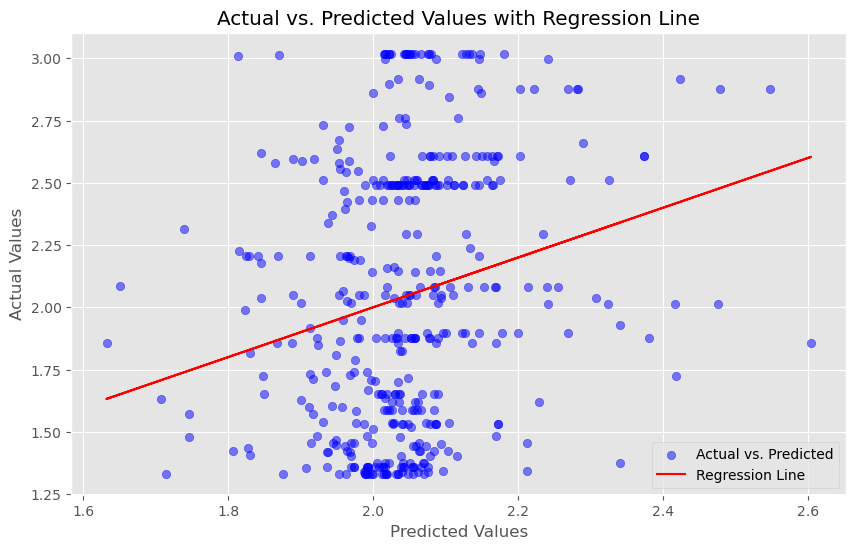

In [102]:
X = df[q2_df_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [103]:
check_linearity(df, q2_df_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,0.883538,Linear,0.917927,Linear
1,touchCount,0.866501,Linear,0.992736,Linear
2,pressure,0.893628,Linear,0.672356,Linear
3,distance,0.881988,Linear,0.756124,Linear
4,acceleration_euclidean_min,0.856760,Linear,0.763332,Linear
5,acceleration_euclidean_max,0.875152,Linear,0.762552,Linear
6,acceleration_x_max,0.806297,Linear,0.873171,Linear
7,velocity_euclidean_min,0.717003,Linear,0.713678,Linear
8,velocity_x_min,0.822906,Linear,0.718464,Linear
9,coordinates_difference_x_abs,0.881449,Linear,0.695282,Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     1.527
Date:                Wed, 31 Jul 2024   Prob (F-statistic):              0.119
Time:                        18:40:19   Log-Likelihood:                -322.60
No. Observations:                 429   AIC:                             669.2
Df Residuals:                     417   BIC:                             717.9
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

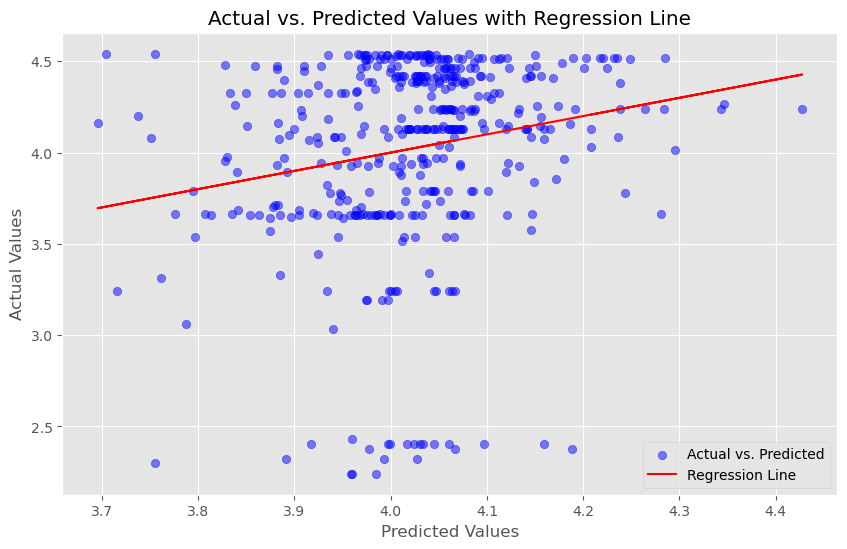

In [104]:
X = df[q2_df_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)

### Linearity Assumptions - With Extrapolation

In [105]:
check_linearity(df_ex, q2_ex_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,0.797520,Linear,0.853485,Linear
1,pressure,0.839266,Linear,0.699965,Linear
2,acceleration_y_mean,0.792225,Linear,0.833438,Linear
3,acceleration_y_max,0.800734,Linear,0.836607,Linear
4,acceleration_euclidean_mean,0.723294,Linear,0.842351,Linear
5,acceleration_x_min,0.819623,Linear,0.652670,Linear
6,acceleration_x_mean,0.793919,Linear,0.917697,Linear
7,velocity_y_mean,0.758634,Linear,0.857662,Linear
8,velocity_y_max,0.777187,Linear,0.868503,Linear
9,velocity_euclidean_min,0.769136,Linear,0.746297,Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.049
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     1.539
Date:                Wed, 31 Jul 2024   Prob (F-statistic):             0.0941
Time:                        18:40:19   Log-Likelihood:                -326.98
No. Observations:                 429   AIC:                             684.0
Df Residuals:                     414   BIC:                             744.9
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

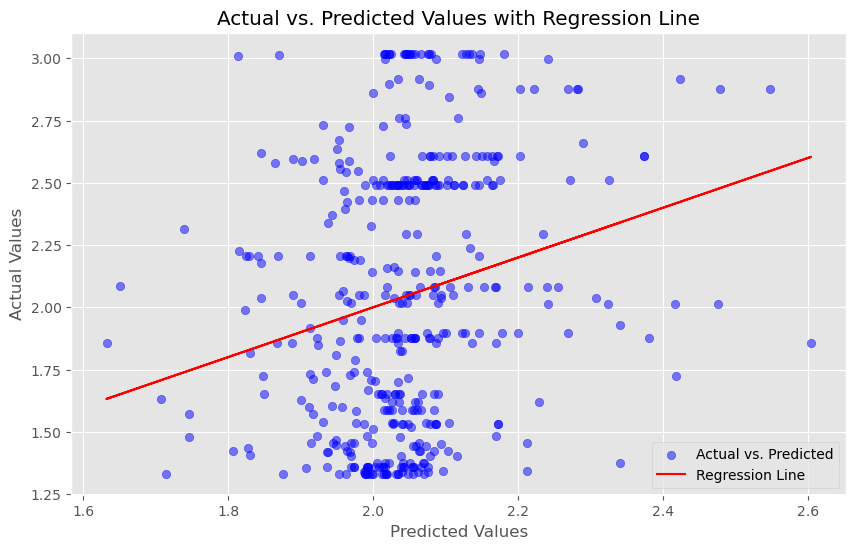

In [106]:
X = df[q2_ex_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [107]:
check_linearity(df_ex, q2_ex_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,0.883538,Linear,0.917927,Linear
1,touchCount,0.866501,Linear,0.992736,Linear
2,pressure,0.893628,Linear,0.672356,Linear
3,distance,0.881988,Linear,0.756124,Linear
4,acceleration_euclidean_min,0.856760,Linear,0.763332,Linear
5,acceleration_euclidean_max,0.875152,Linear,0.762552,Linear
6,acceleration_x_max,0.806297,Linear,0.873171,Linear
7,velocity_euclidean_min,0.717003,Linear,0.713678,Linear
8,velocity_x_min,0.822906,Linear,0.718464,Linear
9,coordinates_difference_x_abs,0.881449,Linear,0.695282,Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     1.527
Date:                Wed, 31 Jul 2024   Prob (F-statistic):              0.119
Time:                        18:40:19   Log-Likelihood:                -322.60
No. Observations:                 429   AIC:                             669.2
Df Residuals:                     417   BIC:                             717.9
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

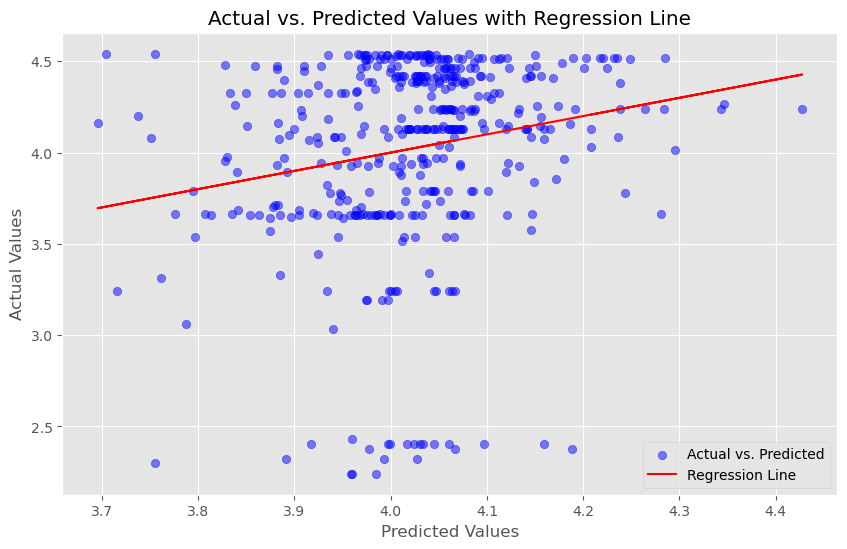

In [108]:
X = df[q2_ex_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)

## Quadrant 3 (Low Valence - Low Arousal)

### Getting the Datasets

In [109]:
df = pd.read_csv("q3.csv")
print_df(df)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,134.0,9,0.019608,41.457420,2.194367e-04,0.008291,0.027406,3.946407e-04,0.009640,0.031045,6.145828e-04,0.005179,0.015663,0.047779,0.306350,0.925868,0.049043,0.385449,1.123576,0.001724,0.225927,0.636547,1204.954477,747.392087,1170.061419,725.004766,22.387321,34.893058,2.429869,1.716384
1,9049.0,847,0.039216,703.832717,5.444847e-07,0.005786,0.238316,1.494392e-06,0.000998,0.081192,9.685755e-08,0.000874,0.051259,0.000108,0.045442,1.023291,0.019360,0.118200,1.331525,0.016898,0.100391,0.851960,903.146494,937.069219,885.105487,233.467757,703.601461,18.041007,1.438073,1.955532
2,144.0,3,0.035294,1.199004,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1327.931437,338.515911,1329.024835,338.023882,0.492029,1.093398,2.073335,1.576200
3,183.0,15,0.037255,5.870653,1.032105e-04,0.001955,0.006365,9.816816e-05,0.001622,0.006365,4.840394e-05,0.000771,0.002126,0.001398,0.059723,0.124701,0.009452,0.066176,0.124701,0.001012,0.016101,0.040904,1228.219250,521.796780,1222.888935,519.336634,2.460145,5.330314,1.359761,1.838903
4,8591.0,421,0.027451,300.315926,0.000000e+00,0.008537,0.198744,1.644329e-06,0.002113,0.034143,1.646578e-06,0.007157,0.053177,0.000000,0.145722,1.636859,0.092737,0.220608,2.237461,0.092737,0.141610,1.525426,1291.934275,537.049679,1168.038633,263.481542,273.568137,123.895642,2.293447,1.498795
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,81.0,7,0.035294,2.760830,2.415474e-04,0.004525,0.014466,3.642039e-05,0.004327,0.010208,2.811987e-07,0.002911,0.009754,0.031138,0.053017,0.076374,0.039351,0.076442,0.123987,0.000006,0.045530,0.107776,1277.088438,461.523196,1276.541739,458.817036,2.706160,0.546699,1.353205,1.365827
232,160.0,8,0.031373,2.280626,1.529259e-04,0.004775,0.017561,4.161483e-04,0.005674,0.027238,4.206167e-04,0.007873,0.047732,0.035961,0.029395,0.071083,0.077946,0.049723,0.132421,0.031981,0.034374,0.127445,1247.019998,433.969570,1247.566697,431.755440,2.214131,0.546699,1.353205,1.365827
233,8624.0,452,0.070000,515.626216,9.097606e-08,0.001815,0.028659,1.017143e-07,0.001272,0.018202,0.000000e+00,0.004185,0.056766,0.001276,0.083291,0.355822,0.001276,0.106535,0.573289,0.000000,0.050673,0.509621,1409.812584,555.154525,906.907896,668.984528,113.830003,502.904687,2.372930,1.427265
234,915.0,102,0.039216,143.010743,1.030602e-05,0.002569,0.024040,3.290105e-05,0.002600,0.024262,4.732915e-06,0.001669,0.005443,0.023850,0.183689,0.748284,0.025187,0.185797,0.756100,0.000009,0.022771,0.127107,1388.615131,260.529340,1245.926600,250.934774,9.594566,142.688531,2.091491,1.330366


In [110]:
df_ex = pd.read_csv("q3-extrapolated.csv")
print_df(df_ex)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,134.000000,9.000000,0.019608,41.457420,2.194367e-04,0.008291,0.027406,3.946407e-04,0.009640,0.031045,6.145828e-04,0.005179,0.015663,0.047779,0.306350,0.925868,0.049043,0.385449,1.123576,0.001724,0.225927,0.636547,1204.954477,747.392087,1170.061419,725.004766,22.387321,34.893058,2.429869,1.716384
1,5028.918224,469.116822,0.030374,405.144791,9.925055e-05,0.006916,0.143209,1.787777e-04,0.004895,0.058579,2.771898e-04,0.002815,0.035207,0.021604,0.163094,0.979360,0.032745,0.238712,1.237754,0.010056,0.157000,0.754823,1039.242150,851.537241,1013.601970,455.118792,396.418449,25.640180,1.885308,1.847692
2,8175.144860,764.177570,0.038831,634.882680,4.910540e-07,0.005218,0.214929,1.347746e-06,0.000900,0.073225,8.735284e-08,0.000788,0.046229,0.000097,0.040982,0.922874,0.017460,0.106601,1.200861,0.015240,0.090539,0.768356,944.830998,878.332679,928.667666,243.727938,634.604741,16.377924,1.500412,1.918308
3,3285.717290,300.766355,0.036678,249.090805,1.920962e-07,0.002041,0.084079,5.272271e-07,0.000352,0.028645,3.417170e-08,0.000308,0.018084,0.000038,0.016032,0.361021,0.006830,0.041701,0.469767,0.005962,0.035418,0.300575,1178.065721,549.687756,1172.408429,301.136091,248.551665,7.072578,1.849212,1.710030
4,151.654206,5.355140,0.035679,2.115870,2.025627e-05,0.000384,0.001249,1.926665e-05,0.000318,0.001249,9.499838e-06,0.000151,0.000417,0.000274,0.011721,0.024474,0.001855,0.012988,0.024474,0.000199,0.003160,0.008028,1308.361755,374.486923,1308.194425,373.608628,0.878295,1.924942,1.933288,1.627759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
424,6962.841121,364.859813,0.062419,414.876147,3.008662e-05,0.002396,0.026481,8.175572e-05,0.002136,0.019975,8.255094e-05,0.004909,0.054993,0.008084,0.072713,0.299938,0.016324,0.095385,0.486764,0.006277,0.047475,0.434615,1377.862637,531.370562,973.766166,622.425548,91.924084,404.311063,2.172797,1.415207
425,5904.235981,328.518692,0.059139,384.166084,3.694880e-06,0.002081,0.027030,1.167344e-05,0.001740,0.020340,1.669790e-06,0.003298,0.038659,0.009241,0.118712,0.494284,0.009712,0.134499,0.637785,0.000003,0.040829,0.374669,1402.334043,451.209658,1026.514962,521.495012,77.055351,375.819081,2.273638,1.393079
426,1671.490654,136.345794,0.042237,179.575812,9.303605e-06,0.002495,0.024494,2.968242e-05,0.002469,0.023667,4.268470e-06,0.001916,0.010479,0.021635,0.173837,0.709771,0.022841,0.178018,0.738160,0.000008,0.025509,0.164643,1390.695255,289.441157,1212.658409,291.958348,19.823277,178.036845,2.119109,1.339875
427,4331.731308,219.693925,0.049826,208.266584,1.504545e-05,0.004087,0.036447,3.567773e-05,0.002002,0.018437,3.781548e-06,0.004247,0.045507,0.016511,0.137620,0.597474,0.024228,0.158449,0.786572,0.002221,0.046077,0.434314,1346.841321,397.581209,1286.361617,520.821570,133.776450,96.210973,2.204785,1.350407


### Univariate Analysis - No Extrapolation

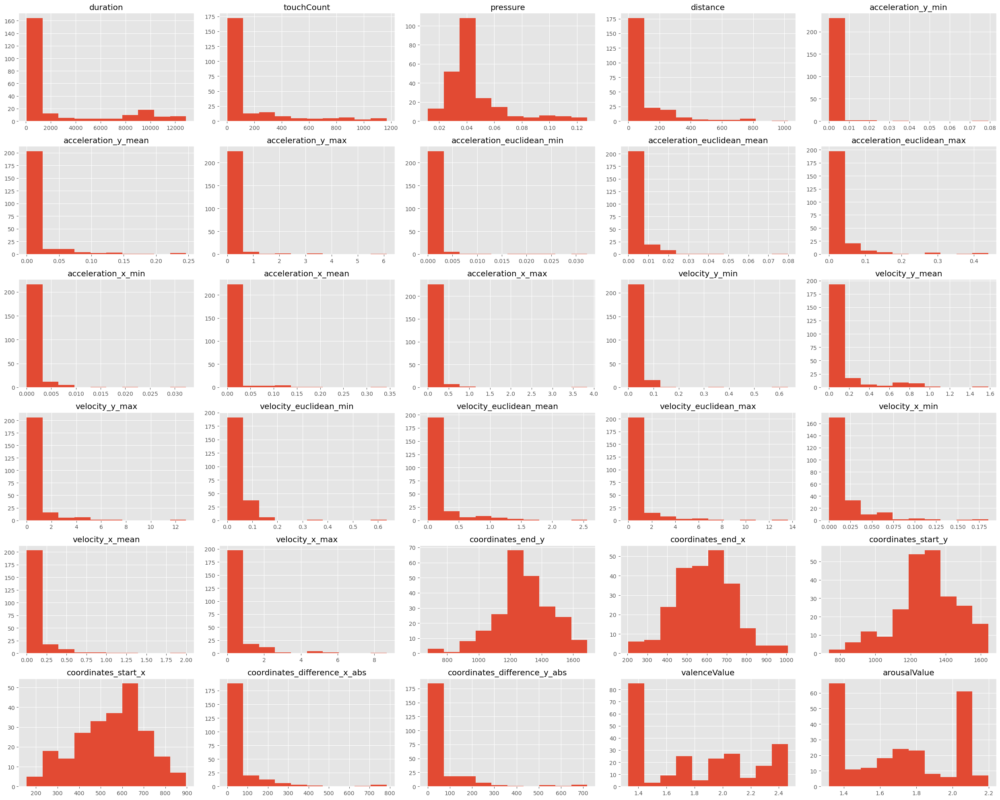

In [111]:
display_histogram(df)

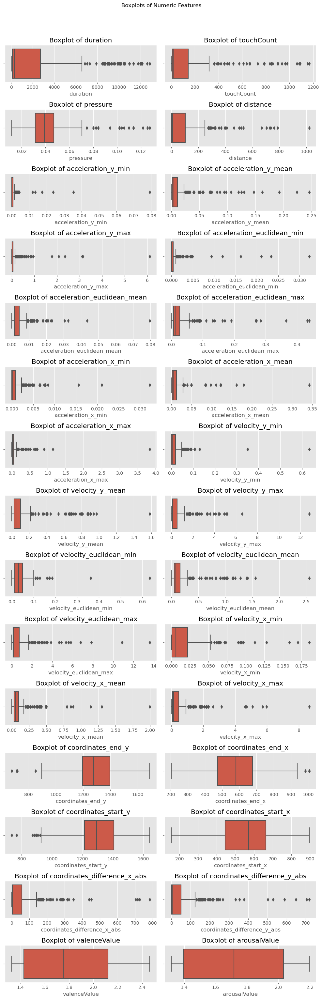

In [112]:
display_boxplot(df)

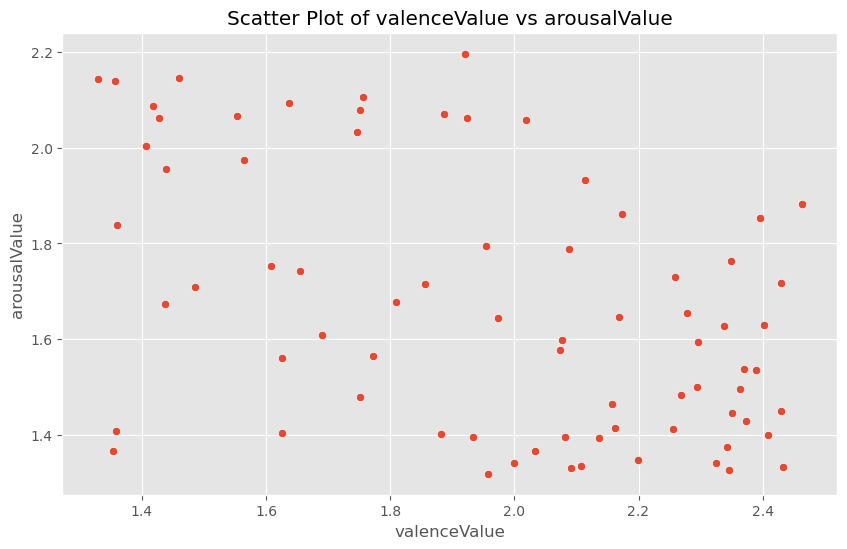

In [113]:
display_scatter_plot(df, 'valenceValue', 'arousalValue')

### Univariate Analysis - With Extrapolation

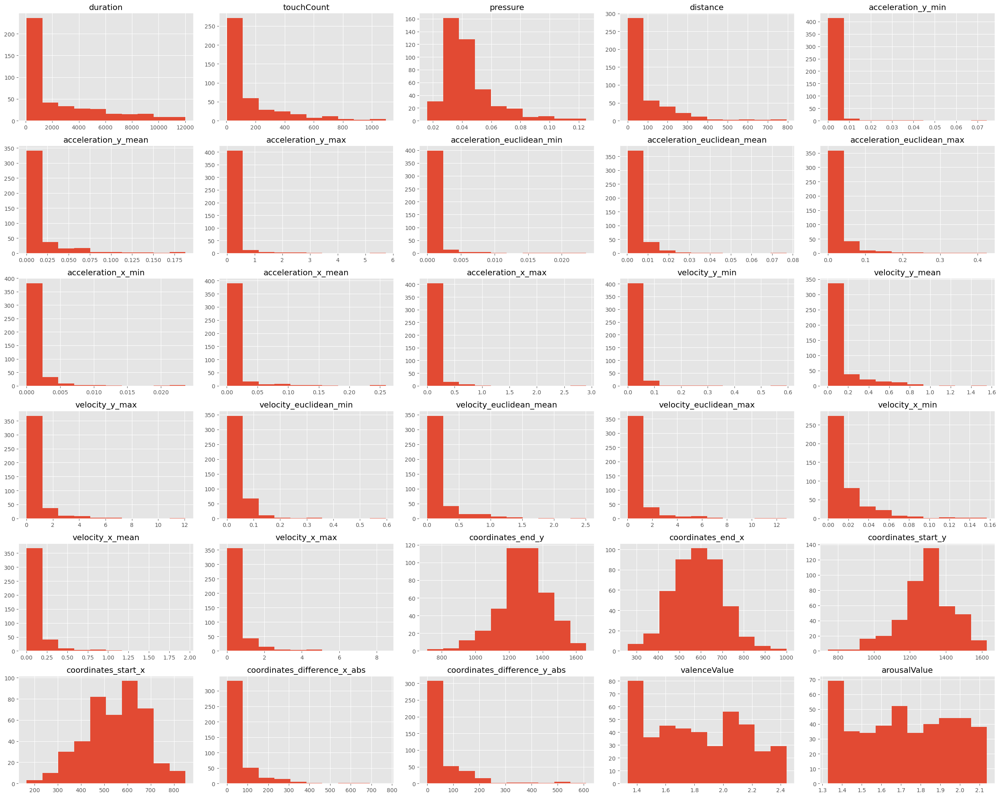

In [114]:
display_histogram(df_ex)

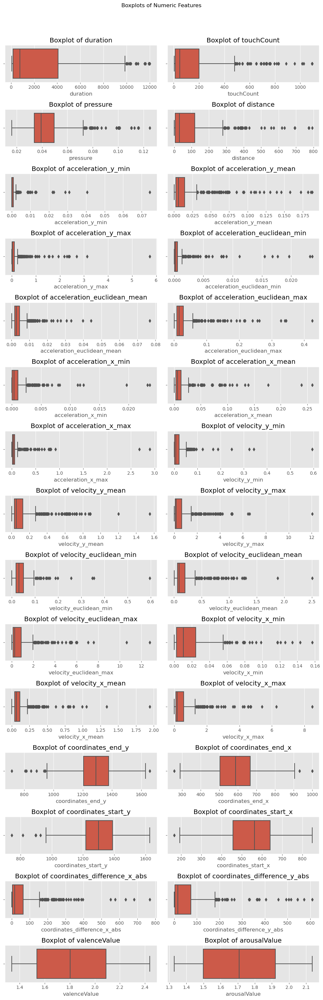

In [115]:
display_boxplot(df_ex)

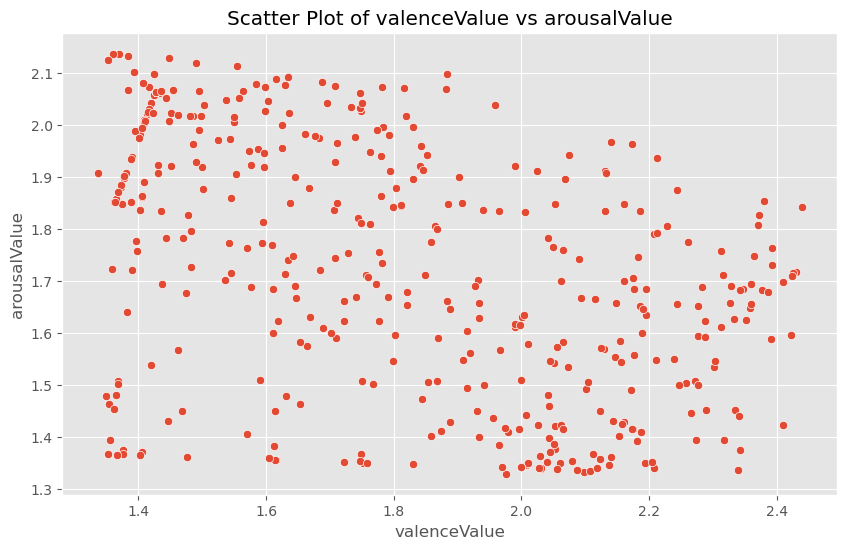

In [116]:
display_scatter_plot(df_ex, 'valenceValue', 'arousalValue')

### Bivariate Analysis - No Extrapolation

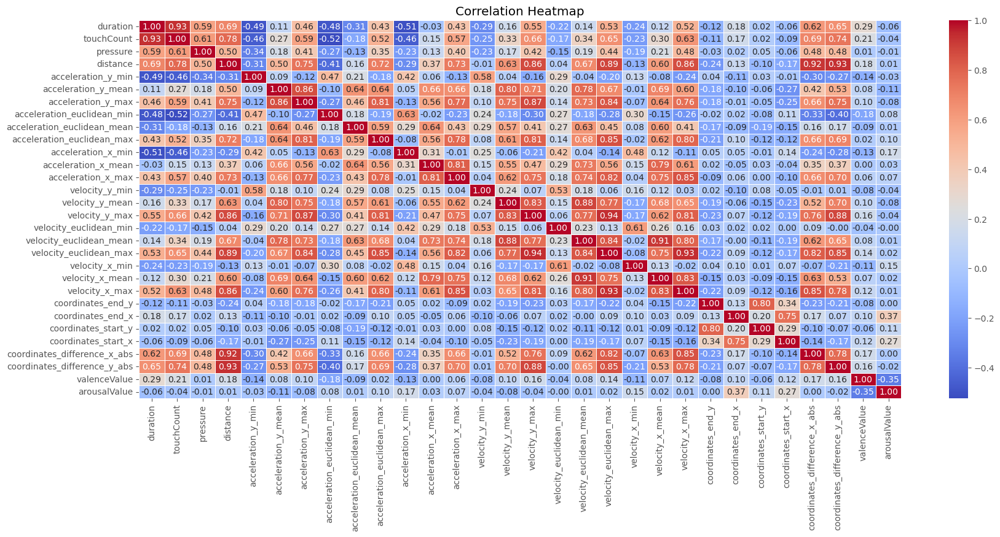

In [117]:
correlation_heatmap(df)

In [118]:
X_features = df.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df[['valenceValue', 'arousalValue']]

In [119]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,0.285699,0.000008,-0.063800,3.291093e-01
touchCount,0.213896,0.000944,-0.036497,5.769196e-01
pressure,0.011949,0.855116,-0.014685,8.224396e-01
distance,0.175800,0.006780,0.012484,8.486986e-01
acceleration_y_min,-0.143370,0.027652,-0.032748,6.166893e-01
acceleration_y_mean,0.084949,0.193450,-0.113770,8.113290e-02
acceleration_y_max,0.095025,0.145574,-0.076586,2.411924e-01
acceleration_euclidean_min,-0.183871,0.004599,0.078416,2.301000e-01
acceleration_euclidean_mean,-0.089621,0.169991,0.014842,8.205671e-01
acceleration_euclidean_max,0.019098,0.770400,0.097118,1.368683e-01


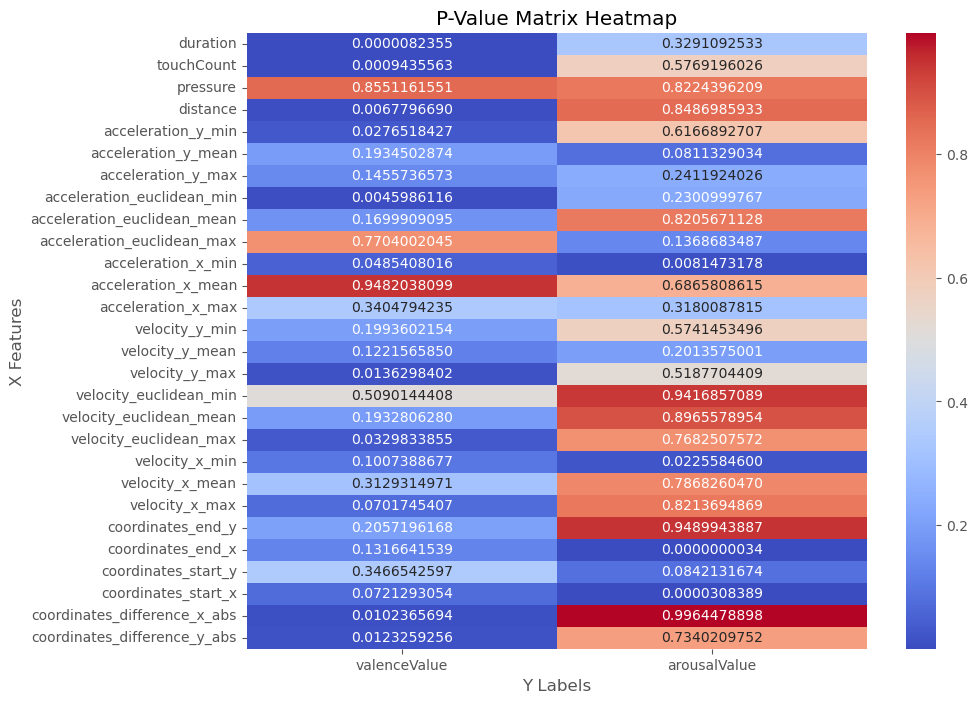

In [120]:
visualize_p_value_matrix(p_value)

In [121]:
# Getting Features with Significant Relationship (Valence)
q3_df_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
q3_df_val_sig

['duration',
 'touchCount',
 'distance',
 'acceleration_y_min',
 'acceleration_euclidean_min',
 'acceleration_x_min',
 'velocity_y_max',
 'velocity_euclidean_max',
 'coordinates_difference_x_abs',
 'coordinates_difference_y_abs']

In [122]:
# Save to text file
np.savetxt('q3_df_val_sig.txt', q3_df_val_sig, fmt='%s')

In [123]:
# Getting Features with Significant Relationship (Valence)
q3_df_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
q3_df_ars_sig

['acceleration_x_min',
 'velocity_x_min',
 'coordinates_end_x',
 'coordinates_start_x']

In [124]:
np.savetxt('q3_df_ars_sig.txt', q3_df_ars_sig, fmt='%s')

### Bivariate Analysis - With Extrapolation

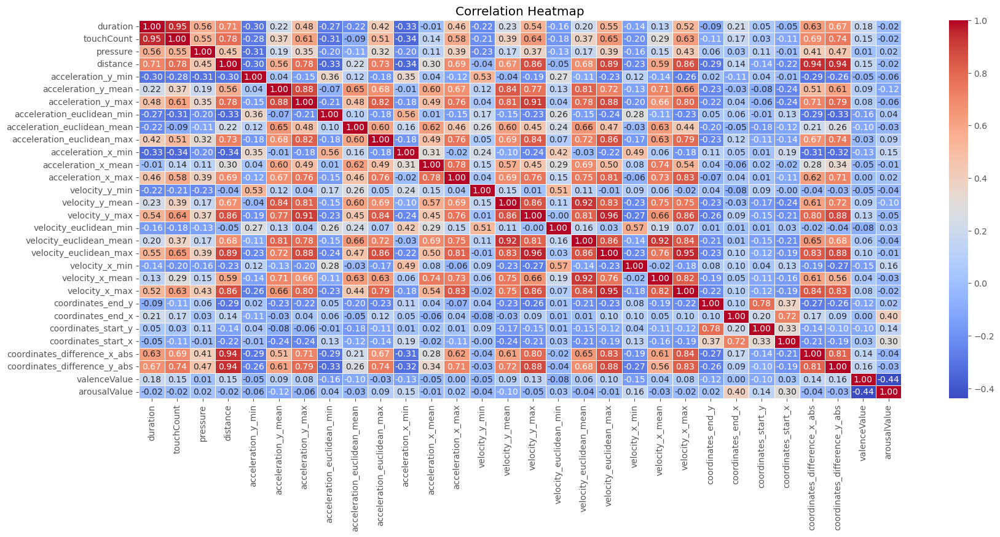

In [125]:
correlation_heatmap(df_ex)

In [126]:
X_features = df_ex.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df_ex[['valenceValue', 'arousalValue']]

In [127]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,0.180645,0.000169,-0.018782,6.980838e-01
touchCount,0.149430,0.001913,-0.022950,6.354833e-01
pressure,0.006116,0.899488,0.022106,6.479744e-01
distance,0.148907,0.001985,-0.022723,6.388258e-01
acceleration_y_min,-0.053531,0.268589,-0.056997,2.387714e-01
acceleration_y_mean,0.086447,0.073671,-0.118206,1.429493e-02
acceleration_y_max,0.079466,0.100235,-0.055517,2.512122e-01
acceleration_euclidean_min,-0.157269,0.001082,0.036144,4.552539e-01
acceleration_euclidean_mean,-0.102625,0.033586,-0.033896,4.837921e-01
acceleration_euclidean_max,-0.029209,0.546273,0.088183,6.804754e-02


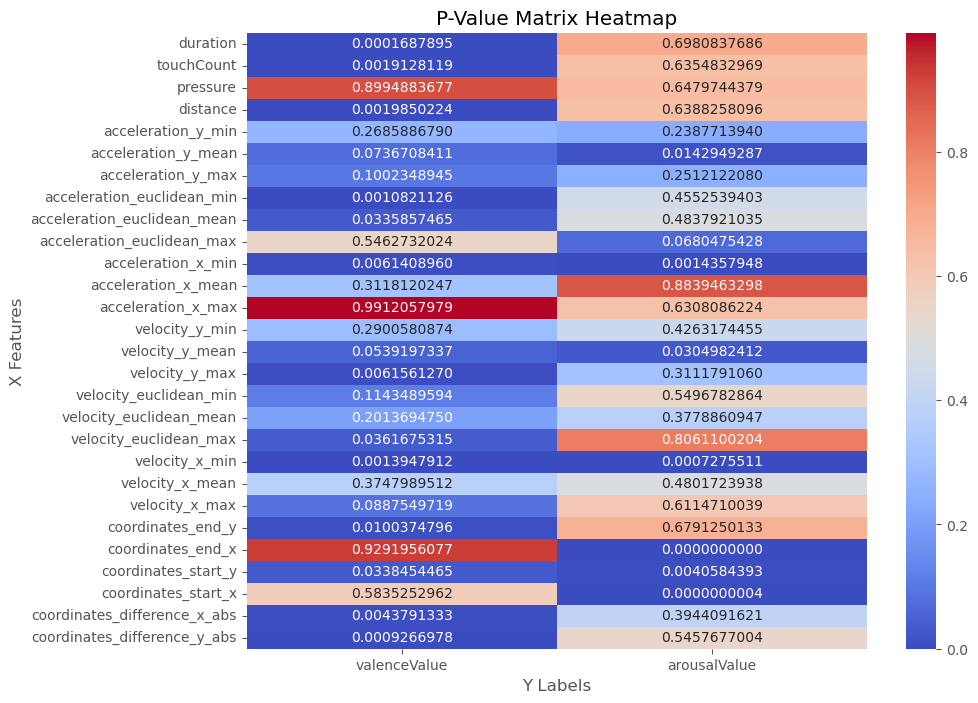

In [128]:
visualize_p_value_matrix(p_value)

In [129]:
# Getting Features with Significant Relationship (Valence)
q3_ex_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
q3_ex_val_sig

['duration',
 'touchCount',
 'distance',
 'acceleration_euclidean_min',
 'acceleration_euclidean_mean',
 'acceleration_x_min',
 'velocity_y_max',
 'velocity_euclidean_max',
 'velocity_x_min',
 'coordinates_end_y',
 'coordinates_start_y',
 'coordinates_difference_x_abs',
 'coordinates_difference_y_abs']

In [130]:
# Save to text file
np.savetxt('q3_ex_val_sig.txt', q3_ex_val_sig, fmt='%s')

In [131]:
# Getting Features with Significant Relationship (Valence)
q3_ex_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
q3_ex_ars_sig

['acceleration_y_mean',
 'acceleration_x_min',
 'velocity_y_mean',
 'velocity_x_min',
 'coordinates_end_x',
 'coordinates_start_y',
 'coordinates_start_x']

In [132]:
np.savetxt('q3_ex_ars_sig.txt', q3_ex_ars_sig, fmt='%s')

### Linearity Assumptions - No Extrapolation

In [133]:
check_linearity(df, q3_df_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,0.091367,Linear,0.508214,Linear
1,touchCount,0.093135,Linear,0.548249,Linear
2,distance,0.121835,Linear,0.400969,Linear
3,acceleration_y_min,0.114469,Linear,0.502369,Linear
4,acceleration_euclidean_min,0.112712,Linear,0.674057,Linear
5,acceleration_x_min,0.105787,Linear,0.583225,Linear
6,velocity_y_max,0.097416,Linear,0.446940,Linear
7,velocity_euclidean_max,0.097537,Linear,0.429062,Linear
8,coordinates_difference_x_abs,0.107507,Linear,0.362572,Linear
9,coordinates_difference_y_abs,0.129362,Linear,0.355160,Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.080
Model:                            OLS   Adj. R-squared:                  0.039
Method:                 Least Squares   F-statistic:                     1.949
Date:                Wed, 31 Jul 2024   Prob (F-statistic):             0.0400
Time:                        18:40:39   Log-Likelihood:                -105.07
No. Observations:                 236   AIC:                             232.1
Df Residuals:                     225   BIC:                             270.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

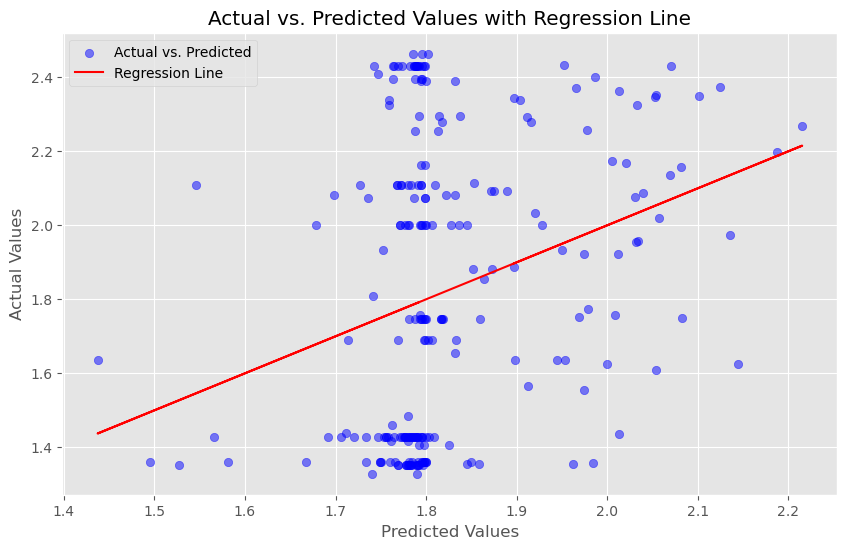

In [134]:
X = df[q3_df_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [135]:
check_linearity(df, q3_df_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,acceleration_x_min,0.493234,Linear,0.217354,Linear
1,velocity_x_min,0.414591,Linear,0.212532,Linear
2,coordinates_end_x,0.662934,Linear,0.322216,Linear
3,coordinates_start_x,0.632109,Linear,0.138511,Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.122
Model:                            OLS   Adj. R-squared:                  0.107
Method:                 Least Squares   F-statistic:                     8.027
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           4.47e-06
Time:                        18:40:39   Log-Likelihood:                -25.905
No. Observations:                 236   AIC:                             61.81
Df Residuals:                     231   BIC:                             79.13
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.3124    

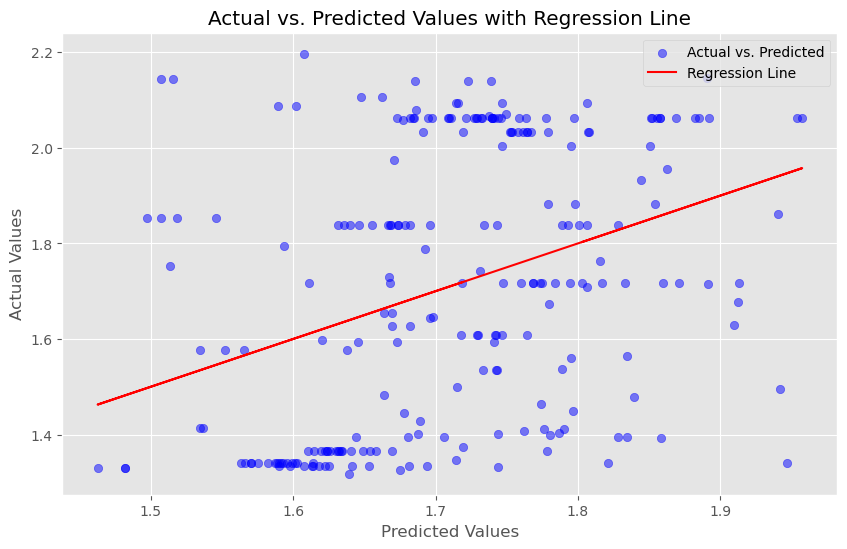

In [136]:
X = df[q3_df_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)

### Linearity Assumptions - With Extrapolation

In [137]:
check_linearity(df_ex, q3_ex_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,duration,0.151020,Linear,0.299880,Linear
1,touchCount,0.174913,Linear,0.305281,Linear
2,distance,0.202084,Linear,0.205815,Linear
3,acceleration_euclidean_min,0.187262,Linear,0.549544,Linear
4,acceleration_euclidean_mean,0.145734,Linear,0.213691,Linear
5,acceleration_x_min,0.168260,Linear,0.331051,Linear
6,velocity_y_max,0.137294,Linear,0.299423,Linear
7,velocity_euclidean_max,0.139353,Linear,0.242259,Linear
8,velocity_x_min,0.100992,Linear,0.277793,Linear
9,coordinates_end_y,0.232983,Linear,0.456932,Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.069
Method:                 Least Squares   F-statistic:                     2.332
Date:                Wed, 31 Jul 2024   Prob (F-statistic):            0.00632
Time:                        18:40:39   Log-Likelihood:                -99.774
No. Observations:                 236   AIC:                             227.5
Df Residuals:                     222   BIC:                             276.0
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

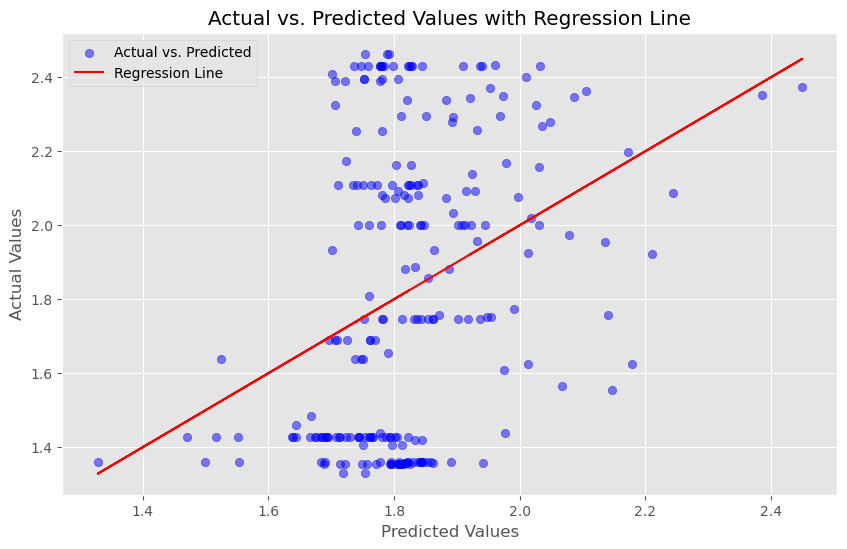

In [138]:
X = df[q3_ex_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [139]:
check_linearity(df_ex, q3_ex_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,acceleration_y_mean,0.421897,Linear,0.035707,Not Linear
1,acceleration_x_min,0.523871,Linear,0.048861,Not Linear
2,velocity_y_mean,0.496511,Linear,0.034155,Not Linear
3,velocity_x_min,0.383927,Linear,0.041947,Not Linear
4,coordinates_end_x,0.847207,Linear,0.126994,Linear
5,coordinates_start_y,0.522907,Linear,0.036404,Not Linear
6,coordinates_start_x,0.776084,Linear,0.010941,Not Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.165
Model:                            OLS   Adj. R-squared:                  0.139
Method:                 Least Squares   F-statistic:                     6.440
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           6.26e-07
Time:                        18:40:40   Log-Likelihood:                -19.973
No. Observations:                 236   AIC:                             55.95
Df Residuals:                     228   BIC:                             83.66
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.4171    

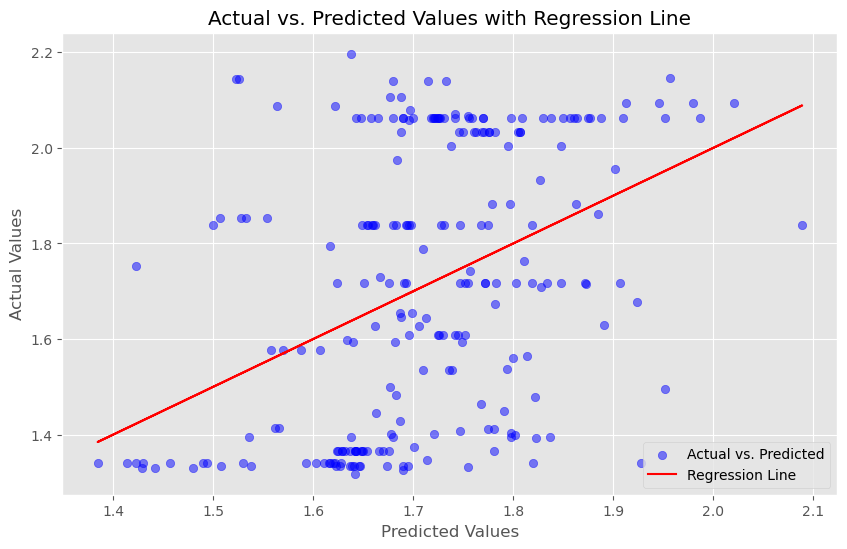

In [140]:
X = df[q3_ex_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)

## Quadrant 4 (High Valence - Low Arousal)

### Getting the Datasets

In [141]:
df = pd.read_csv("q4.csv")
print_df(df)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,10929.0,888,0.105882,212.076642,1.932184e-06,0.014012,0.291054,0.000025,0.003680,0.134571,7.461655e-07,0.011947,0.558334,0.001806,0.126974,1.201133,0.005476,0.175037,2.477405,0.000021,0.096131,2.239881,1294.848180,612.084105,1087.498949,567.555479,44.528627,207.349231,3.569503,1.356594
1,138.0,10,0.035294,4.592352,4.505801e-07,0.001005,0.002194,0.000153,0.000914,0.001798,1.165195e-03,0.008351,0.044008,0.000012,0.027581,0.041442,0.017925,0.041848,0.058463,0.009742,0.028502,0.044081,1180.869429,252.656875,1178.135934,256.347093,3.690218,2.733495,3.273037,1.342908
2,132.0,12,0.031373,4.397105,3.736152e-04,0.002953,0.007253,0.000187,0.001907,0.006147,1.880289e-03,0.009423,0.023958,0.006036,0.028734,0.069520,0.030089,0.058265,0.116798,0.014390,0.048743,0.097812,1380.414647,634.717327,1377.681152,638.161530,3.444203,2.733495,3.498767,1.552713
3,11946.0,1103,0.105882,160.293390,1.377284e-03,0.034690,1.099626,0.000122,0.006418,0.236228,2.262454e-05,0.022280,0.390163,0.019471,0.251731,6.118615,0.036978,0.323039,6.313339,0.004560,0.162758,1.565414,1170.118823,499.163444,1311.372155,574.935914,75.772470,141.253332,3.352422,1.427989
4,1380.0,128,0.027451,108.931434,0.000000e+00,0.040312,0.199808,0.004643,0.004972,0.031302,4.643300e-03,0.019904,0.189269,0.000000,0.411912,1.422416,0.032503,0.472319,1.506711,0.032503,0.176637,0.762408,1378.774550,450.698557,1272.714847,425.851091,24.847466,106.059703,3.533660,1.434473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,122.0,6,0.031373,1.093398,0.000000e+00,0.000304,0.000970,0.000327,0.003203,0.008014,3.266906e-04,0.004126,0.008014,0.000000,0.006401,0.032005,0.063136,0.063477,0.108780,0.063136,0.062165,0.108780,1409.936388,614.544137,1408.842990,614.544137,0.000000,1.093398,3.579257,1.346695
167,162.0,12,0.047059,6.301046,1.560565e-05,0.001735,0.007132,0.000427,0.002028,0.007819,3.546017e-04,0.008889,0.017082,0.000000,0.063837,0.112874,0.000000,0.075803,0.131126,0.000000,0.039801,0.069921,1328.478136,293.495256,1323.557846,297.431488,3.936232,4.920290,3.268950,1.386657
168,604.0,69,0.035294,88.076610,2.070659e-05,0.002545,0.009478,0.000082,0.002260,0.007080,3.752698e-06,0.002970,0.030771,0.000691,0.167205,0.384676,0.011069,0.172237,0.384683,0.000123,0.022590,0.083091,1272.168148,245.276440,1184.149622,242.078251,3.198189,88.018525,3.273037,1.342908
169,7118.0,41,0.050980,14.279233,2.792328e-03,0.000644,0.005046,0.000701,0.000609,0.003400,7.011303e-04,0.001838,0.018235,0.047470,0.006818,0.062825,0.023838,0.016444,0.084990,0.023838,0.013197,0.081495,1232.259127,903.365230,1224.605342,915.419942,12.054711,7.653785,3.439914,1.344401


In [142]:
df_ex = pd.read_csv("q4-extrapolated.csv")
print_df(df_ex)

,duration,touchCount,pressure,distance,acceleration_y_min,acceleration_y_mean,acceleration_y_max,acceleration_euclidean_min,acceleration_euclidean_mean,acceleration_euclidean_max,acceleration_x_min,acceleration_x_mean,acceleration_x_max,velocity_y_min,velocity_y_mean,velocity_y_max,velocity_euclidean_min,velocity_euclidean_mean,velocity_euclidean_max,velocity_x_min,velocity_x_mean,velocity_x_max,coordinates_end_y,coordinates_end_x,coordinates_start_y,coordinates_start_x,coordinates_difference_x_abs,coordinates_difference_y_abs,valenceValue,arousalValue
0,10929.000000,888.000000,0.105882,212.076642,1.932184e-06,0.014012,0.291054,0.000025,0.003680,0.134571,7.461655e-07,0.011947,0.558334,0.001806,0.126974,1.201133,0.005476,0.175037,2.477405,0.000021,0.096131,2.239881,1294.848180,612.084105,1087.498949,567.555479,44.528627,207.349231,3.569503,1.356594
1,6642.855140,539.261682,0.077845,129.664658,1.343696e-06,0.008846,0.176320,0.000076,0.002581,0.081834,4.632608e-04,0.010519,0.354046,0.001093,0.087496,0.740508,0.010421,0.122135,1.516610,0.003882,0.069269,1.367717,1249.576246,469.320953,1123.499621,443.944671,28.307763,126.076625,3.451748,1.351158
2,2356.710280,190.523364,0.049808,47.252674,7.552089e-07,0.003679,0.061586,0.000126,0.001483,0.029097,9.257755e-04,0.009090,0.149758,0.000381,0.048017,0.279884,0.015365,0.069232,0.555816,0.007743,0.042407,0.495554,1204.304312,326.557801,1159.500293,320.333864,12.086900,44.804020,3.333993,1.345722
3,136.850467,10.383178,0.034543,4.554945,7.194473e-05,0.001378,0.003163,0.000159,0.001104,0.002631,1.302199e-03,0.008556,0.040167,0.001166,0.027802,0.046822,0.020255,0.044993,0.069640,0.010632,0.032380,0.054376,1219.100055,325.855373,1216.366560,329.498457,3.643084,2.733495,3.316284,1.383104
4,134.467290,11.177570,0.032985,4.477393,2.201643e-04,0.002152,0.005172,0.000173,0.001499,0.004359,1.586232e-03,0.008982,0.032203,0.003558,0.028260,0.057974,0.025087,0.051514,0.092810,0.012479,0.040419,0.075717,1298.358669,477.608356,1295.625175,481.153724,3.545368,2.733495,3.405944,1.466438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
424,3282.654206,57.485981,0.041745,57.730025,1.160439e-03,0.001763,0.007655,0.000337,0.001581,0.005566,2.905248e-04,0.002504,0.025616,0.019927,0.101251,0.252326,0.016320,0.108173,0.261445,0.009875,0.018728,0.082435,1255.756962,515.892391,1200.785619,518.966423,6.840123,54.971342,3.341659,1.343522
425,5869.990654,46.364486,0.047975,28.417982,2.261317e-03,0.001008,0.005895,0.000583,0.000926,0.004105,5.675205e-04,0.002055,0.020637,0.038507,0.037546,0.124488,0.021392,0.046292,0.142408,0.019295,0.014997,0.081801,1239.905248,777.282799,1216.854480,786.415225,10.357901,23.050768,3.407942,1.344115
426,5836.448598,36.476636,0.047755,12.060335,3.819350e-03,0.000708,0.005610,0.003248,0.000900,0.005391,2.719487e-03,0.002126,0.017266,0.052120,0.006944,0.064318,0.043154,0.018982,0.101445,0.038400,0.015882,0.098669,1279.244601,854.907258,1273.276897,865.191584,10.284326,6.192515,3.375039,1.341083
427,3360.724299,27.738318,0.041525,7.773829,5.803370e-03,0.000832,0.006699,0.008167,0.001461,0.009239,6.618584e-03,0.002684,0.015394,0.061103,0.007187,0.067202,0.080468,0.023885,0.133235,0.066529,0.021068,0.131847,1370.011994,761.295264,1367.301492,768.159529,6.864265,3.369607,3.249713,1.334672


### Univariate Analysis - No Extrapolation

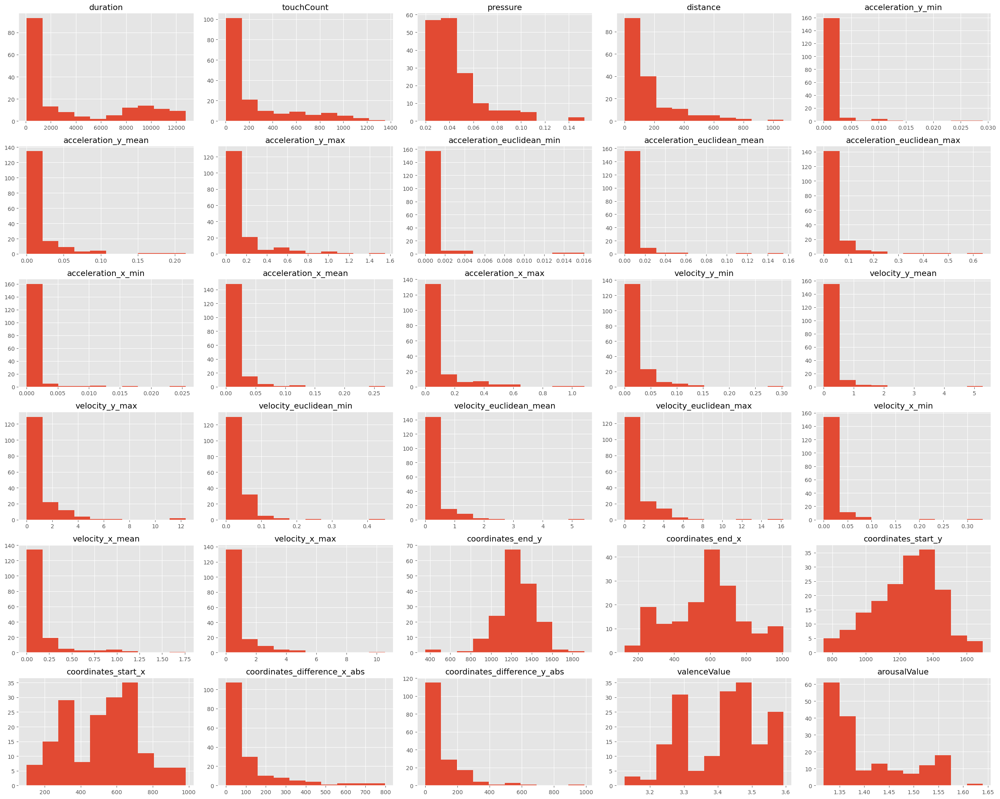

In [143]:
display_histogram(df)

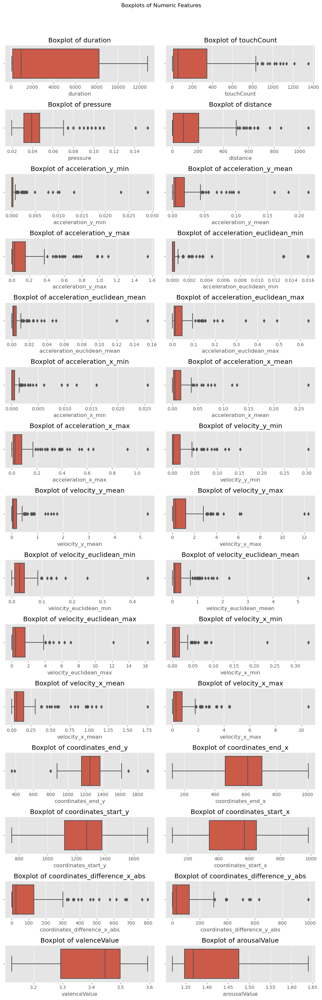

In [144]:
display_boxplot(df)

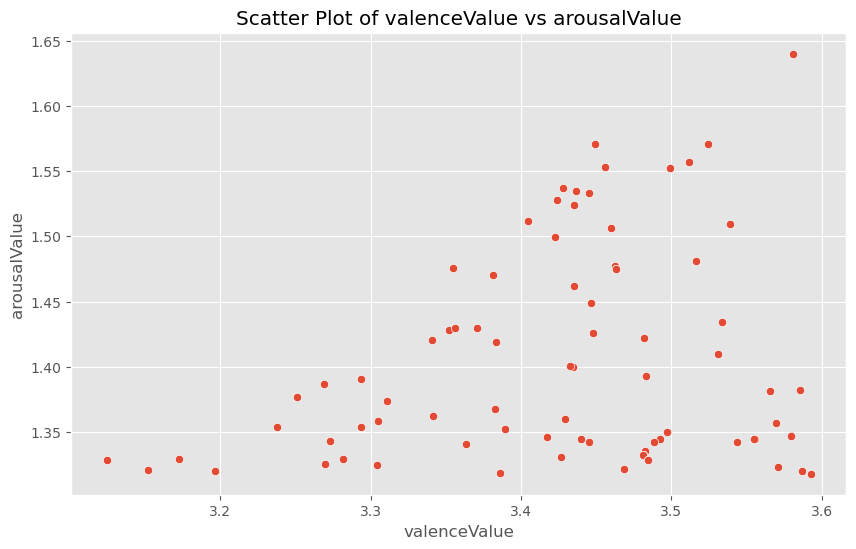

In [145]:
display_scatter_plot(df, 'valenceValue', 'arousalValue')

### Univariate Analysis - With Extrapolation

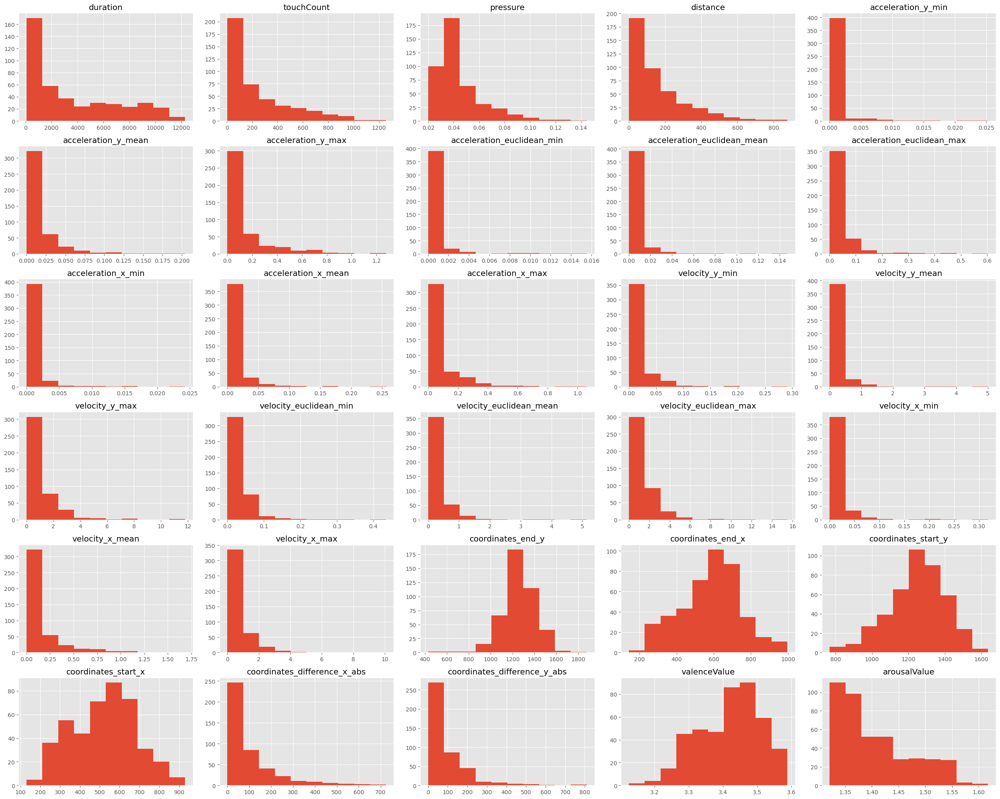

In [146]:
display_histogram(df_ex)

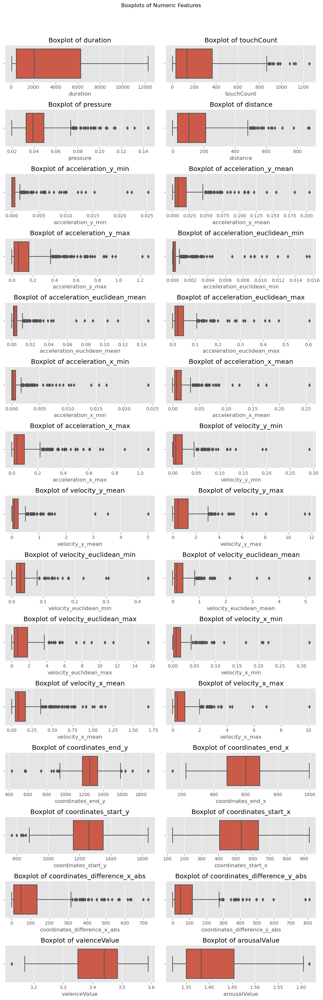

In [147]:
display_boxplot(df_ex)

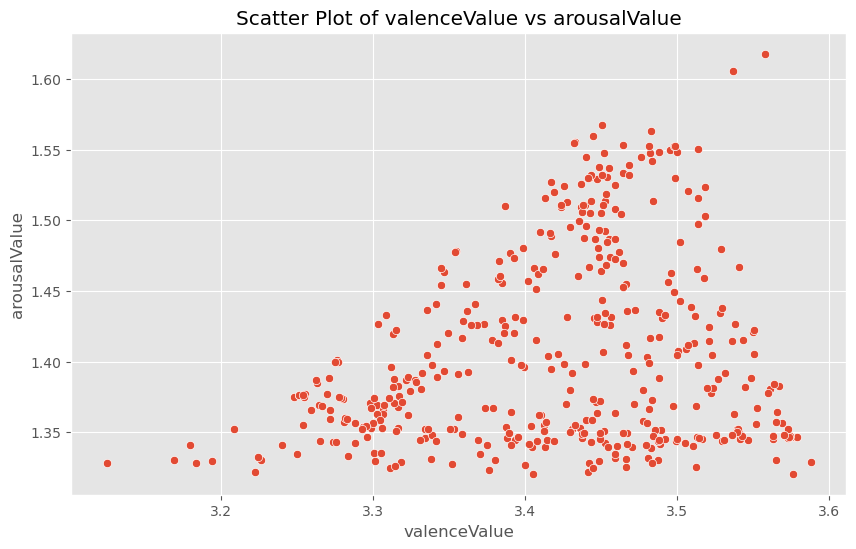

In [148]:
display_scatter_plot(df_ex, 'valenceValue', 'arousalValue')

### Bivariate Analysis - No Extrapolation

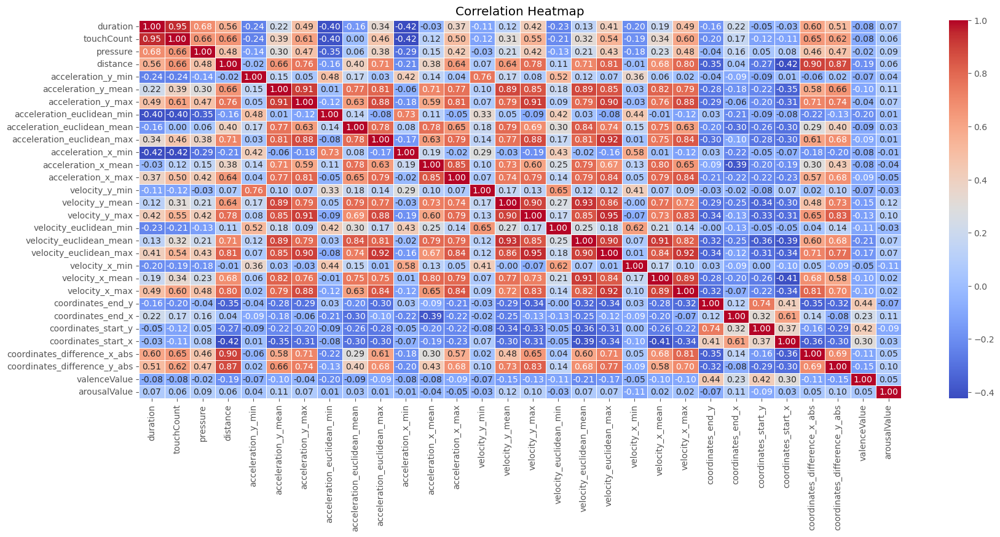

In [149]:
correlation_heatmap(df)

In [150]:
X_features = df.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df[['valenceValue', 'arousalValue']]

In [151]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,-0.081526,2.891264e-01,0.073857,0.337041
touchCount,-0.084745,2.704436e-01,0.056195,0.465370
pressure,-0.018802,8.071606e-01,0.093445,0.224116
distance,-0.194112,1.095994e-02,0.062200,0.418983
acceleration_y_min,-0.070442,3.599116e-01,0.036198,0.638332
acceleration_y_mean,-0.100892,1.891811e-01,0.108829,0.156512
acceleration_y_max,-0.041765,5.875561e-01,0.073107,0.341983
acceleration_euclidean_min,-0.197795,9.508563e-03,0.007097,0.926594
acceleration_euclidean_mean,-0.087670,2.541956e-01,0.028147,0.714785
acceleration_euclidean_max,-0.094430,2.192526e-01,0.007893,0.918392


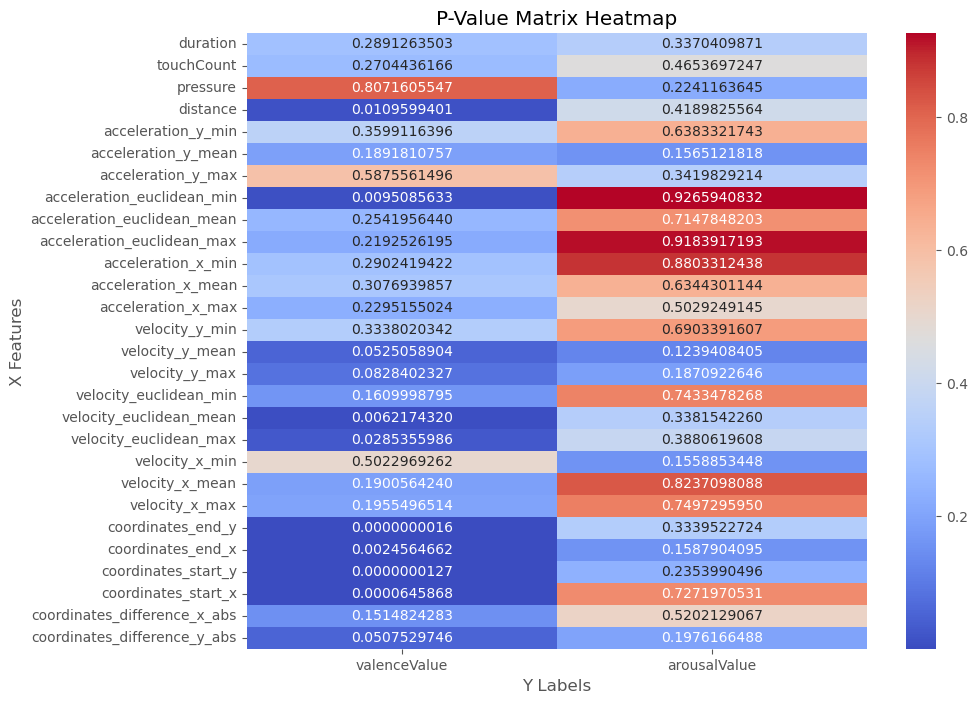

In [152]:
visualize_p_value_matrix(p_value)

In [153]:
# Getting Features with Significant Relationship (Valence)
q4_df_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
q4_df_val_sig

['distance',
 'acceleration_euclidean_min',
 'velocity_euclidean_mean',
 'velocity_euclidean_max',
 'coordinates_end_y',
 'coordinates_end_x',
 'coordinates_start_y',
 'coordinates_start_x']

In [154]:
# Save to text file
np.savetxt('q4_df_val_sig.txt', q4_df_val_sig, fmt='%s')

In [155]:
# Getting Features with Significant Relationship (Valence)
q4_df_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
q4_df_ars_sig

[]

In [156]:
q4_df_ars_sig = q4_df_val_sig

In [157]:
np.savetxt('q4_df_ars_sig.txt', q4_df_ars_sig, fmt='%s')

### Bivariate Analysis - With Extrapolation

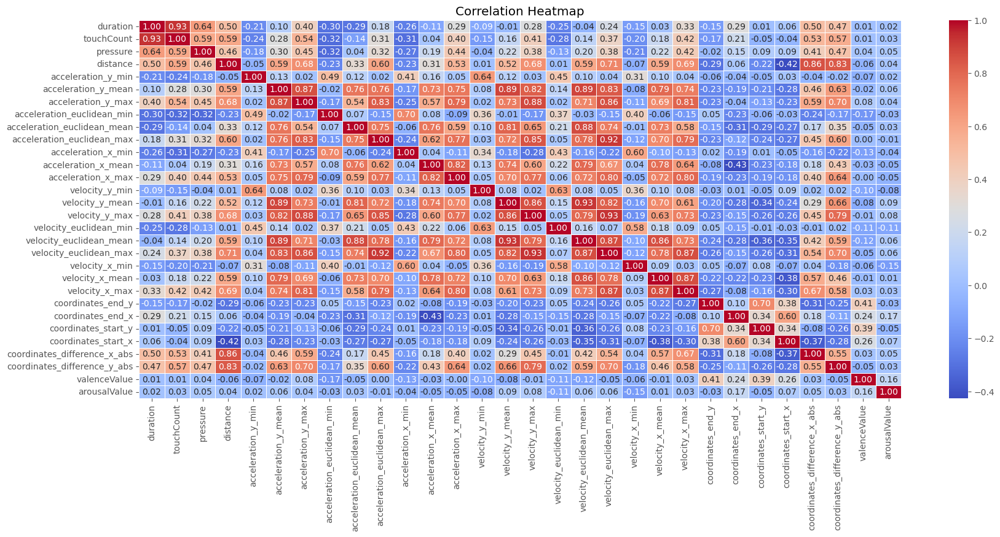

In [158]:
correlation_heatmap(df_ex)

In [159]:
X_features = df_ex.drop(['valenceValue', 'arousalValue'], axis=1)
y_labels = df_ex[['valenceValue', 'arousalValue']]

In [160]:
# Spearman Correlation
corr, p_value = p_value_matrix_spearmanr(X_features, y_labels)

relationship_df = pd.concat([corr['valenceValue'], p_value['valenceValue'], corr['arousalValue'], p_value['arousalValue']], axis=1)
relationship_df.columns = ['valence correlation', 'valence p-value', 'arousal correlation', 'arousal p-value']

relationship_df

,valence correlation,valence p-value,arousal correlation,arousal p-value
duration,0.008650,8.582250e-01,0.022586,0.640859
touchCount,0.011194,8.171779e-01,0.029576,0.541237
pressure,0.036562,4.500475e-01,0.054383,0.261040
distance,-0.057168,2.373636e-01,0.035815,0.459375
acceleration_y_min,-0.067660,1.618420e-01,0.019000,0.694750
acceleration_y_mean,-0.022304,6.450339e-01,0.055541,0.251007
acceleration_y_max,0.079883,9.845983e-02,0.041540,0.390754
acceleration_euclidean_min,-0.172738,3.251134e-04,-0.025717,0.595283
acceleration_euclidean_mean,-0.047113,3.302986e-01,0.027943,0.563817
acceleration_euclidean_max,0.000569,9.906298e-01,-0.007687,0.873870


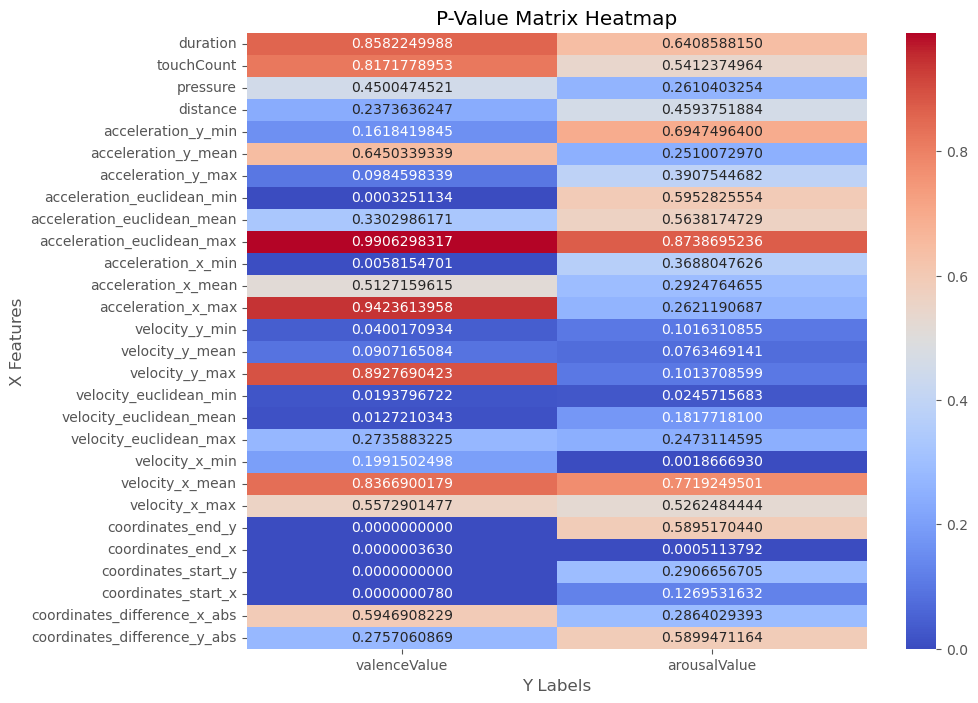

In [161]:
visualize_p_value_matrix(p_value)

In [162]:
# Getting Features with Significant Relationship (Valence)
q4_ex_val_sig = relationship_df.index[relationship_df['valence p-value'] <= 0.05].tolist()
q4_ex_val_sig

['acceleration_euclidean_min',
 'acceleration_x_min',
 'velocity_y_min',
 'velocity_euclidean_min',
 'velocity_euclidean_mean',
 'coordinates_end_y',
 'coordinates_end_x',
 'coordinates_start_y',
 'coordinates_start_x']

In [163]:
# Save to text file
np.savetxt('q4_ex_val_sig.txt', q4_ex_val_sig, fmt='%s')

In [164]:
# Getting Features with Significant Relationship (Valence)
q4_ex_ars_sig = relationship_df.index[relationship_df['arousal p-value'] <= 0.05].tolist()
q4_ex_ars_sig

['velocity_euclidean_min', 'velocity_x_min', 'coordinates_end_x']

In [165]:
np.savetxt('q4_ex_ars_sig.txt', q4_ex_ars_sig, fmt='%s')

### Linearity Assumptions - No Extrapolation

In [166]:
check_linearity(df, q4_df_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,distance,0.417523,Linear,0.167740,Linear
1,acceleration_euclidean_min,0.441856,Linear,0.203388,Linear
2,velocity_euclidean_mean,0.447435,Linear,0.141249,Linear
3,velocity_euclidean_max,0.400349,Linear,0.120671,Linear
4,coordinates_end_y,0.339545,Linear,0.156168,Linear
5,coordinates_end_x,0.362650,Linear,0.062174,Linear
6,coordinates_start_y,0.366201,Linear,0.058484,Linear
7,coordinates_start_x,0.508260,Linear,0.148113,Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.207
Model:                            OLS   Adj. R-squared:                  0.168
Method:                 Least Squares   F-statistic:                     5.277
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           6.94e-06
Time:                        18:40:59   Log-Likelihood:                 145.99
No. Observations:                 171   AIC:                            -274.0
Df Residuals:                     162   BIC:                            -245.7
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

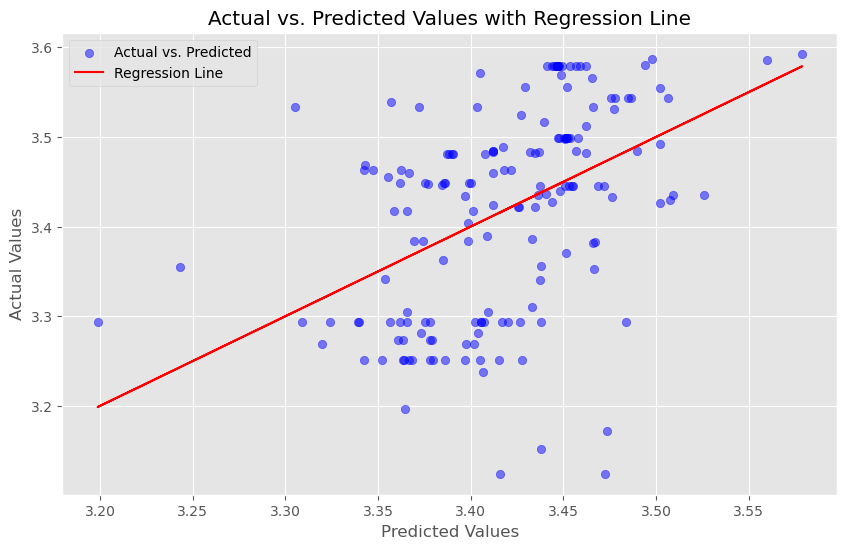

In [167]:
X = df[q4_df_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [168]:
check_linearity(df, q4_df_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,distance,0.917999,Linear,0.276539,Linear
1,acceleration_euclidean_min,0.940587,Linear,0.305195,Linear
2,velocity_euclidean_mean,0.936788,Linear,0.245237,Linear
3,velocity_euclidean_max,0.935512,Linear,0.343164,Linear
4,coordinates_end_y,0.922405,Linear,0.376480,Linear
5,coordinates_end_x,0.659924,Linear,0.174289,Linear
6,coordinates_start_y,0.939211,Linear,0.325057,Linear
7,coordinates_start_x,0.894594,Linear,0.327972,Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.077
Model:                            OLS   Adj. R-squared:                  0.032
Method:                 Least Squares   F-statistic:                     1.697
Date:                Wed, 31 Jul 2024   Prob (F-statistic):              0.103
Time:                        18:40:59   Log-Likelihood:                 192.19
No. Observations:                 171   AIC:                            -366.4
Df Residuals:                     162   BIC:                            -338.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

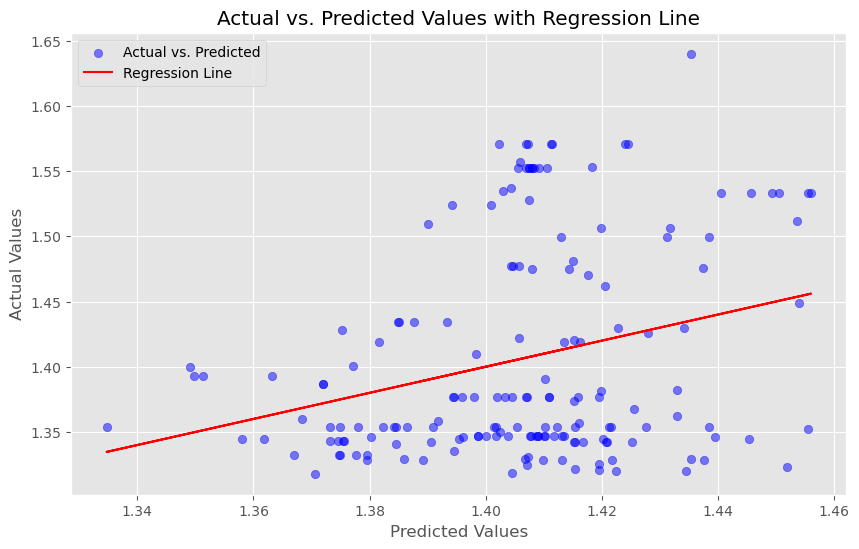

In [169]:
X = df[q4_df_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)

### Linearity Assumptions - With Extrapolation

In [170]:
check_linearity(df_ex, q4_ex_val_sig, 'valenceValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,acceleration_euclidean_min,0.080385,Linear,0.040482,Not Linear
1,acceleration_x_min,0.083438,Linear,0.045662,Not Linear
2,velocity_y_min,0.078329,Linear,0.007355,Not Linear
3,velocity_euclidean_min,0.064963,Linear,0.110514,Linear
4,velocity_euclidean_mean,0.063354,Linear,0.013099,Not Linear
5,coordinates_end_y,0.013518,Not Linear,0.009445,Not Linear
6,coordinates_end_x,0.031718,Not Linear,0.000518,Not Linear
7,coordinates_start_y,0.027720,Not Linear,0.002603,Not Linear
8,coordinates_start_x,0.081314,Linear,0.009038,Not Linear


                            OLS Regression Results                            
Dep. Variable:           valenceValue   R-squared:                       0.186
Model:                            OLS   Adj. R-squared:                  0.141
Method:                 Least Squares   F-statistic:                     4.089
Date:                Wed, 31 Jul 2024   Prob (F-statistic):           9.49e-05
Time:                        18:40:59   Log-Likelihood:                 143.79
No. Observations:                 171   AIC:                            -267.6
Df Residuals:                     161   BIC:                            -236.2
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

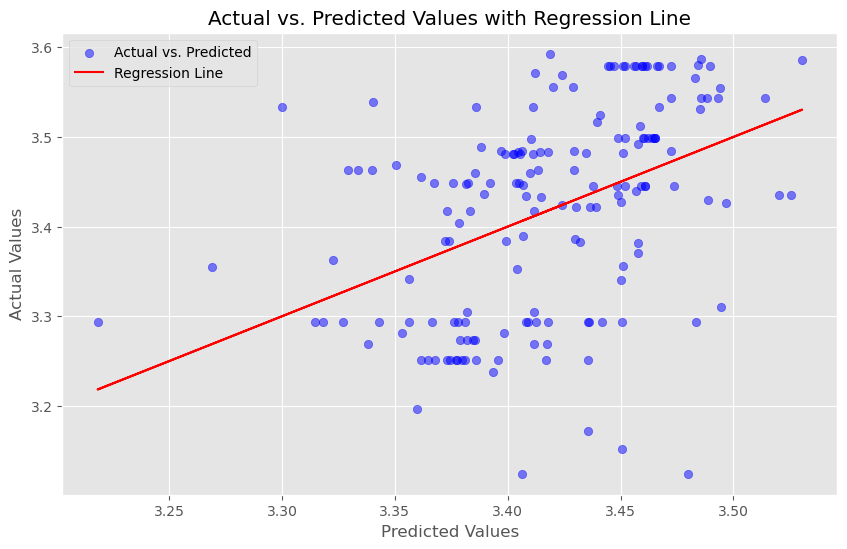

In [171]:
X = df[q4_ex_val_sig]
y = df[['valenceValue']]

OLS_whole(X, y)

In [172]:
check_linearity(df_ex, q4_ex_ars_sig, 'arousalValue')

,feature,Rainbow p_value,isLinear on Rainbow,Harvey Collier p_value,isLinear on Harvey Collier
0,velocity_euclidean_min,0.971735,Linear,0.088193,Linear
1,velocity_x_min,0.968087,Linear,0.206562,Linear
2,coordinates_end_x,0.422925,Linear,0.011257,Not Linear


                            OLS Regression Results                            
Dep. Variable:           arousalValue   R-squared:                       0.069
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     4.096
Date:                Wed, 31 Jul 2024   Prob (F-statistic):            0.00776
Time:                        18:41:00   Log-Likelihood:                 191.38
No. Observations:                 171   AIC:                            -374.8
Df Residuals:                     167   BIC:                            -362.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

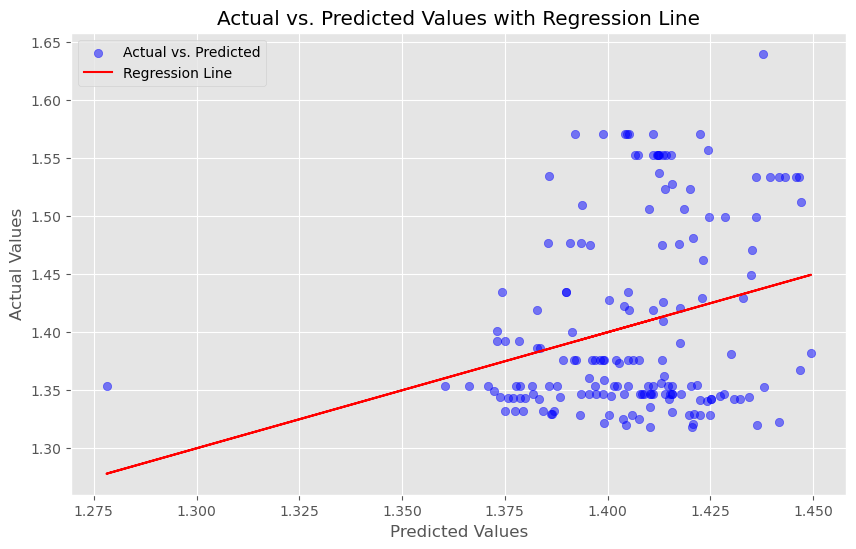

In [173]:
X = df[q4_ex_ars_sig]
y = df[['arousalValue']]

OLS_whole(X, y)